# C S S Pramod's Project 01, Bankruptcy Prediction

Introduction:

Predicting the financial position of companies has become one of the key interests for the creditors,investors and other stock holders alike, for Investment Decisions, Risk Management, Customer Relationships and in case of MNCs, Regulatory Compliances with respect to the laws and rules of different sovereign nations.

Predictive models can help MNCs', Banks and NBFCs' to gauge the performance and stability of a company, to assess creditworthiness and to anticipate potential risks by analysing past data and market trends.

The purpose of our present project is to build models to predict whether a comapny is likely to be bankrupt or solvent by combining various econometric parameteres.

      

Body:

In [ ]:
# Import Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import imblearn
from imblearn.under_sampling import NearMiss
from imblearn.over_sampling import SMOTE
from collections import Counter



In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score
from sklearn.model_selection import GridSearchCV

In [ ]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.ensemble import VotingClassifier,RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import PowerTransformer

In [ ]:
from sklearn.naive_bayes import GaussianNB
from mpl_toolkits.mplot3d import Axes3D
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.feature_selection import SelectFromModel
from sklearn.model_selection import cross_val_score, RepeatedStratifiedKFold,RandomizedSearchCV

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from imblearn.ensemble import EasyEnsembleClassifier
from sklearn.feature_selection import VarianceThreshold, mutual_info_classif
from sklearn.linear_model import Lasso
import statsmodels.api as sm
import warnings
warnings.filterwarnings('ignore')
pd.options.display.float_format='{:,.6f}'.format

In [ ]:
# Import Dataset
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
df=pd.read_csv('/content/drive/MyDrive/CSSPramod Project 1/Project 1/Bankruptcy Prediction.csv')

In [ ]:
df

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
0,1,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,...,0.716845,0.009219,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,1,0.016469
1,1,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,...,0.795297,0.008323,0.623652,0.610237,0.839969,0.283846,0.264577,0.570175,1,0.020794
2,1,0.426071,0.499019,0.472295,0.601450,0.601364,0.998857,0.796403,0.808388,0.302035,...,0.774670,0.040003,0.623841,0.601449,0.836774,0.290189,0.026555,0.563706,1,0.016474
3,1,0.399844,0.451265,0.457733,0.583541,0.583541,0.998700,0.796967,0.808966,0.303350,...,0.739555,0.003252,0.622929,0.583538,0.834697,0.281721,0.026697,0.564663,1,0.023982
4,1,0.465022,0.538432,0.522298,0.598783,0.598783,0.998973,0.797366,0.809304,0.303475,...,0.795016,0.003878,0.623521,0.598782,0.839973,0.278514,0.024752,0.575617,1,0.035490
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6814,0,0.493687,0.539468,0.543230,0.604455,0.604462,0.998992,0.797409,0.809331,0.303510,...,0.799927,0.000466,0.623620,0.604455,0.840359,0.279606,0.027064,0.566193,1,0.029890
6815,0,0.475162,0.538269,0.524172,0.598308,0.598308,0.998992,0.797414,0.809327,0.303520,...,0.799748,0.001959,0.623931,0.598306,0.840306,0.278132,0.027009,0.566018,1,0.038284
6816,0,0.472725,0.533744,0.520638,0.610444,0.610213,0.998984,0.797401,0.809317,0.303512,...,0.797778,0.002840,0.624156,0.610441,0.840138,0.275789,0.026791,0.565158,1,0.097649
6817,0,0.506264,0.559911,0.554045,0.607850,0.607850,0.999074,0.797500,0.809399,0.303498,...,0.811808,0.002837,0.623957,0.607846,0.841084,0.277547,0.026822,0.565302,1,0.044009


In [ ]:
df.head(5)

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
0,1,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,...,0.716845,0.009219,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,1,0.016469
1,1,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,...,0.795297,0.008323,0.623652,0.610237,0.839969,0.283846,0.264577,0.570175,1,0.020794
2,1,0.426071,0.499019,0.472295,0.601450,0.601364,0.998857,0.796403,0.808388,0.302035,...,0.774670,0.040003,0.623841,0.601449,0.836774,0.290189,0.026555,0.563706,1,0.016474
3,1,0.399844,0.451265,0.457733,0.583541,0.583541,0.998700,0.796967,0.808966,0.303350,...,0.739555,0.003252,0.622929,0.583538,0.834697,0.281721,0.026697,0.564663,1,0.023982
4,1,0.465022,0.538432,0.522298,0.598783,0.598783,0.998973,0.797366,0.809304,0.303475,...,0.795016,0.003878,0.623521,0.598782,0.839973,0.278514,0.024752,0.575617,1,0.035490


In [ ]:
# Dataset Exploration
df.describe()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
count,"6,819.000000","6,819.000000","6,819.000000","6,819.000000","6,819.000000","6,819.000000","6,819.000000","6,819.000000","6,819.000000","6,819.000000",...,"6,819.000000","6,819.000000","6,819.000000","6,819.000000","6,819.000000","6,819.000000","6,819.000000","6,819.000000","6,819.000000","6,819.000000"
mean,0.032263,0.505180,0.558625,0.553589,0.607948,0.607929,0.998755,0.797190,0.809084,0.303623,...,0.807760,"18,629,417.811836",0.623915,0.607946,0.840402,0.280365,0.027541,0.565358,1.000000,0.047578
std,0.176710,0.060686,0.065620,0.061595,0.016934,0.016916,0.013010,0.012869,0.013601,0.011163,...,0.040332,"376,450,059.745822",0.012290,0.016934,0.014523,0.014463,0.015668,0.013214,0.000000,0.050014
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
25%,0.000000,0.476527,0.535543,0.527277,0.600445,0.600434,0.998969,0.797386,0.809312,0.303466,...,0.796750,0.000904,0.623636,0.600443,0.840115,0.276944,0.026791,0.565158,1.000000,0.024477
50%,0.000000,0.502706,0.559802,0.552278,0.605997,0.605976,0.999022,0.797464,0.809375,0.303525,...,0.810619,0.002085,0.623879,0.605998,0.841179,0.278778,0.026808,0.565252,1.000000,0.033798
75%,0.000000,0.535563,0.589157,0.584105,0.613914,0.613842,0.999095,0.797579,0.809469,0.303585,...,0.826455,0.005270,0.624168,0.613913,0.842357,0.281449,0.026913,0.565725,1.000000,0.052838
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,"9,820,000,000.000000",1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6819 entries, 0 to 6818
Data columns (total 96 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0   Bankrupt?                                                 6819 non-null   int64  
 1    ROA(C) before interest and depreciation before interest  6819 non-null   float64
 2    ROA(A) before interest and % after tax                   6819 non-null   float64
 3    ROA(B) before interest and depreciation after tax        6819 non-null   float64
 4    Operating Gross Margin                                   6819 non-null   float64
 5    Realized Sales Gross Margin                              6819 non-null   float64
 6    Operating Profit Rate                                    6819 non-null   float64
 7    Pre-tax net Interest Rate                                6819 non-null   float64
 8    After-tax net Int

All the columns data types are correctly identified.

In [ ]:
df.isnull().sum()

Bankrupt?                                                   0
 ROA(C) before interest and depreciation before interest    0
 ROA(A) before interest and % after tax                     0
 ROA(B) before interest and depreciation after tax          0
 Operating Gross Margin                                     0
                                                           ..
 Liability to Equity                                        0
 Degree of Financial Leverage (DFL)                         0
 Interest Coverage Ratio (Interest expense to EBIT)         0
 Net Income Flag                                            0
 Equity to Liability                                        0
Length: 96, dtype: int64

There are no missing values.

In [ ]:
# Duplicated
df[df.duplicated()]

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability


In [ ]:
df[df.duplicated()].shape

(0, 96)

In [ ]:
# Numerical Variables
numerical_features=[feature for feature in df.columns if df[feature].dtypes !='O']
print ('Number of numerical variables:', len(numerical_features))


Number of numerical variables: 96


Numerical Variables are of two types, Discrete and Continuous.

In [ ]:
discrete_feature= [feature for feature in numerical_features if len(df[feature].unique())< 96]
print('Discrete Variables Count: {}'.format(len(discrete_feature)))

Discrete Variables Count: 3


In [ ]:
continuous_feature=[feature for feature in numerical_features if feature not in discrete_feature]
print('Continous Feature Count: {}'.format(len(continuous_feature)))

Continous Feature Count: 93


In [ ]:
df.corr()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
Bankrupt?,1.000000,-0.260807,-0.282941,-0.273051,-0.100043,-0.099445,-0.000230,-0.008517,-0.008857,-0.016593,...,-0.315457,0.035104,-0.005547,-0.100044,-0.180987,0.166812,0.010508,-0.005509,NaN,-0.083048
ROA(C) before interest and depreciation before interest,-0.260807,1.000000,0.940124,0.986849,0.334719,0.332755,0.035725,0.053419,0.049222,0.020501,...,0.887670,-0.071725,0.008135,0.334721,0.274287,-0.143629,-0.016575,0.010573,NaN,0.052416
ROA(A) before interest and % after tax,-0.282941,0.940124,1.000000,0.955741,0.326969,0.324956,0.032053,0.053518,0.049474,0.029649,...,0.961552,-0.098900,0.011463,0.326971,0.291744,-0.141039,-0.011515,0.013372,NaN,0.057887
ROA(B) before interest and depreciation after tax,-0.273051,0.986849,0.955741,1.000000,0.333749,0.331755,0.035212,0.053726,0.049952,0.022366,...,0.912040,-0.089088,0.007523,0.333750,0.280617,-0.142838,-0.014663,0.011473,NaN,0.056430
Operating Gross Margin,-0.100043,0.334719,0.326969,0.333749,1.000000,0.999518,0.005745,0.032493,0.027175,0.051438,...,0.300143,0.022672,0.004205,1.000000,0.075304,-0.085434,-0.011806,-0.001167,NaN,0.120029
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Liability to Equity,0.166812,-0.143629,-0.141039,-0.142838,-0.085434,-0.085407,0.001541,-0.004043,-0.004390,-0.011899,...,-0.159697,0.021982,-0.003724,-0.085434,-0.791836,1.000000,0.002119,0.001487,NaN,-0.159654
Degree of Financial Leverage (DFL),0.010508,-0.016575,-0.011515,-0.014663,-0.011806,-0.011268,0.000935,0.000855,0.000927,-0.000556,...,-0.010463,-0.001881,-0.008812,-0.011806,-0.000093,0.002119,1.000000,0.016513,NaN,-0.016739
Interest Coverage Ratio (Interest expense to EBIT),-0.005509,0.010573,0.013372,0.011473,-0.001167,-0.001158,0.000393,0.000984,0.000957,0.001024,...,0.012746,0.000239,0.001027,-0.001169,0.005147,0.001487,0.016513,1.000000,NaN,-0.008339
Net Income Flag,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# **Exploratory Data Analysis**

To obtain a better understanding of the dataset, the distribution of key variables and the relationships among them were plotted.

In [ ]:
print(df.isna().sum().sum())
print(np.isnan(df).sum().sum())
print(df.isnull().sum().sum())

0
0
0


In [ ]:
list_1=[]
for i in df.columns:
  x=df[i].value_counts()
  if len(x)<=2:
    list_1.append(i)
  else:
    continue

In [ ]:
list_1

['Bankrupt?', ' Liability-Assets Flag', ' Net Income Flag']

In [ ]:
df[' Liability-Assets Flag'].unique()

array([0, 1])

In [ ]:
df[' Liability-Assets Flag'].value_counts()

 Liability-Assets Flag
0    6811
1       8
Name: count, dtype: int64

Liability/Assets Feature has a very large class imbalance. So, We can drop this feature.

In [ ]:
df[' Net Income Flag'].unique()

array([1])

Net Income has just one unique value. So, We can drop this feature too.

In [ ]:
df.drop(columns=[' Net Income Flag', ' Liability-Assets Flag'], inplace=True)

In [ ]:
df.shape

(6819, 94)

<Axes: xlabel='Bankrupt?'>

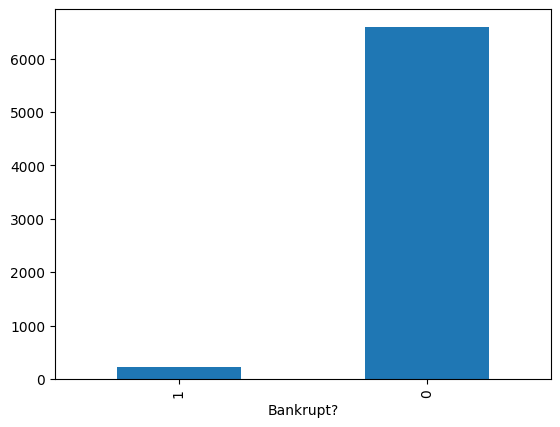

In [ ]:
# Checking the value count of output variable
df['Bankrupt?'].value_counts().sort_values().plot(kind='bar')

<Axes: ylabel='count'>

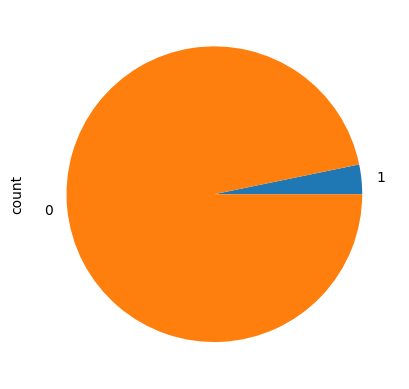

In [ ]:
df['Bankrupt?'].value_counts().sort_values().plot(kind='pie')

In [ ]:
df['Bankrupt?'].value_counts()

Bankrupt?
0    6599
1     220
Name: count, dtype: int64

In [ ]:
220/(6599+220)

0.03226279513125092

The output variable is highly imbalanced with minority class accumulating just 3.2% of the data.

In [ ]:
df.describe()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Current Liability to Current Assets,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Equity to Liability
count,"6,819.000000","6,819.000000","6,819.000000","6,819.000000","6,819.000000","6,819.000000","6,819.000000","6,819.000000","6,819.000000","6,819.000000",...,"6,819.000000","6,819.000000","6,819.000000","6,819.000000","6,819.000000","6,819.000000","6,819.000000","6,819.000000","6,819.000000","6,819.000000"
mean,0.032263,0.505180,0.558625,0.553589,0.607948,0.607929,0.998755,0.797190,0.809084,0.303623,...,0.031506,0.807760,"18,629,417.811836",0.623915,0.607946,0.840402,0.280365,0.027541,0.565358,0.047578
std,0.176710,0.060686,0.065620,0.061595,0.016934,0.016916,0.013010,0.012869,0.013601,0.011163,...,0.030845,0.040332,"376,450,059.745822",0.012290,0.016934,0.014523,0.014463,0.015668,0.013214,0.050014
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.476527,0.535543,0.527277,0.600445,0.600434,0.998969,0.797386,0.809312,0.303466,...,0.018034,0.796750,0.000904,0.623636,0.600443,0.840115,0.276944,0.026791,0.565158,0.024477
50%,0.000000,0.502706,0.559802,0.552278,0.605997,0.605976,0.999022,0.797464,0.809375,0.303525,...,0.027597,0.810619,0.002085,0.623879,0.605998,0.841179,0.278778,0.026808,0.565252,0.033798
75%,0.000000,0.535563,0.589157,0.584105,0.613914,0.613842,0.999095,0.797579,0.809469,0.303585,...,0.038375,0.826455,0.005270,0.624168,0.613913,0.842357,0.281449,0.026913,0.565725,0.052838
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,"9,820,000,000.000000",1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [ ]:
df.info

<bound method DataFrame.info of       Bankrupt?   ROA(C) before interest and depreciation before interest  \
0             1                                           0.370594          
1             1                                           0.464291          
2             1                                           0.426071          
3             1                                           0.399844          
4             1                                           0.465022          
...         ...                                                ...          
6814          0                                           0.493687          
6815          0                                           0.475162          
6816          0                                           0.472725          
6817          0                                           0.506264          
6818          0                                           0.493053          

       ROA(A) before interest and % after tax  \
0                                    0.424389   
1                                    0.538214   
2                                    0.499019   
3                                    0.451265   
4                                    0.538432   
...                                       ...   
6814                                 0.539468   
6815                                 0.538269   
6816                                 0.533744   
6817                                 0.559911   
6818                                 0.570105   

       ROA(B) before interest and depreciation after tax  \
0                                              0.405750    
1                                              0.516730    
2                                              0.472295    
3                                              0.457733    
4                                              0.522298    
...                                                 ...    
6814                                           0.543230    
6815                                           0.524172    
6816                                           0.520638    
6817                                           0.554045    
6818                                           0.549548    

       Operating Gross Margin   Realized Sales Gross Margin  \
0                    0.601457                      0.601457   
1                    0.610235                      0.610235   
2                    0.601450                      0.601364   
3                    0.583541                      0.583541   
4                    0.598783                      0.598783   
...                       ...                           ...   
6814                 0.604455                      0.604462   
6815                 0.598308                      0.598308   
6816                 0.610444                      0.610213   
6817                 0.607850                      0.607850   
6818                 0.627409                      0.627409   

       Operating Profit Rate   Pre-tax net Interest Rate  \
0                   0.998969                    0.796887   
1                   0.998946                    0.797380   
2                   0.998857                    0.796403   
3                   0.998700                    0.796967   
4                   0.998973                    0.797366   
...                      ...                         ...   
6814                0.998992                    0.797409   
6815                0.998992                    0.797414   
6816                0.998984                    0.797401   
6817                0.999074                    0.797500   
6818                0.998080                    0.801987   

       After-tax net Interest Rate  \
0                         0.808809   
1                         0.809301   
2                         0.808388   
3                         0.808966   
4                         0.809304   
...                        

In [ ]:
df.columns

Index(['Bankrupt?', ' ROA(C) before interest and depreciation before interest',
       ' ROA(A) before interest and % after tax',
       ' ROA(B) before interest and depreciation after tax',
       ' Operating Gross Margin', ' Realized Sales Gross Margin',
       ' Operating Profit Rate', ' Pre-tax net Interest Rate',
       ' After-tax net Interest Rate',
       ' Non-industry income and expenditure/revenue',
       ' Continuous interest rate (after tax)', ' Operating Expense Rate',
       ' Research and development expense rate', ' Cash flow rate',
       ' Interest-bearing debt interest rate', ' Tax rate (A)',
       ' Net Value Per Share (B)', ' Net Value Per Share (A)',
       ' Net Value Per Share (C)', ' Persistent EPS in the Last Four Seasons',
       ' Cash Flow Per Share', ' Revenue Per Share (Yuan ¥)',
       ' Operating Profit Per Share (Yuan ¥)',
       ' Per Share Net profit before tax (Yuan ¥)',
       ' Realized Sales Gross Profit Growth Rate',
       ' Operating Profit

In [ ]:
def utils_recognize_type(df,col,max_cat=20):
  if (df[col].dtype=='O') | (df[col].nunique()<max_cat):
    return 'cat'
  else:
    return 'num'

In [ ]:
dic_cols= {col:utils_recognize_type(df,col,max_cat=20) for col in df.columns}
heatmap = df.isnull()
for k, v in dic_cols.items():
  if v=='num':
    heatmap[k]= heatmap[k].apply(lambda x:0.5 if x is False else 1)
  else:
    heatmap[k]=heatmap[k].apply(lambda x: 0 if x is False else 1)

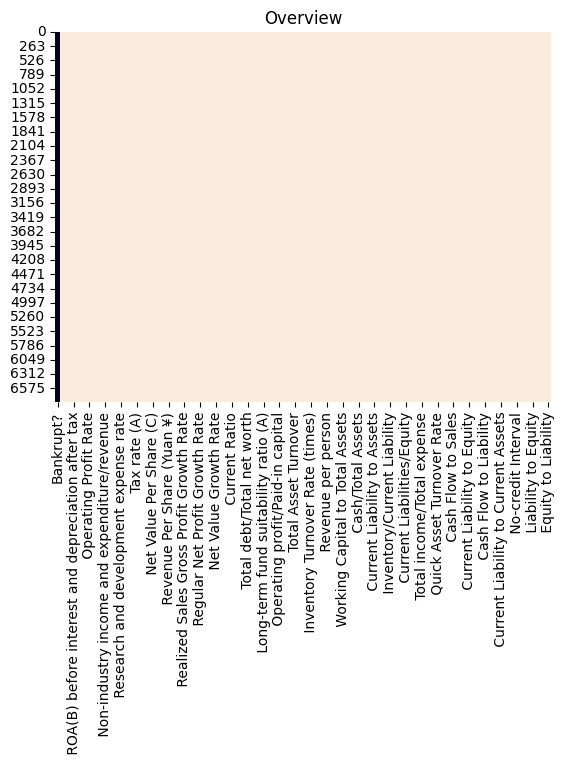

In [ ]:
sns.heatmap(heatmap, cbar=False).set_title('Overview')
plt.show()

# **Feature Selection**

Using VIf

In [ ]:
Y=df['Bankrupt?']
X=df.drop(columns='Bankrupt?')

In [ ]:
X_transformed=X.copy()

In [ ]:
X_transformed.shape

(6819, 93)

In [ ]:
empty_= 0
vif_data=pd.DataFrame()
cols_removed_vif=[]
columns_after_vif=[x for x in X_transformed.columns]

In [ ]:
len(columns_after_vif)

93

In [ ]:
vif_final=X[[x for x in X.columns if x not in cols_removed_vif]]

In [ ]:
vif_final.shape

(6819, 93)

In [ ]:
# Using p_values with VIF

In [ ]:
# Transforming skewed data
skewness=PowerTransformer(standardize=True)
vif_final_transformed=pd.DataFrame(skewness.fit_transform(vif_final), columns=vif_final.columns)

In [ ]:
# Using L1 Regulation with VIF
skewness=PowerTransformer(standardize=False)
vif_final=pd.DataFrame(skewness.fit_transform(vif_final), columns=vif_final.columns)

In [ ]:
#splitting into train and test
X_train, X_test, Y_train, Y_test=train_test_split(vif_final,Y, test_size=0.25, stratify=Y, random_state=43)

In [ ]:
X_train.shape

(5114, 93)

In [ ]:
#scaling the data
scaler=StandardScaler()
X_train=scaler.fit_transform(X_train)
X_test=scaler.transform(X_test)


In [ ]:
#fitting the LR Model
lr=LogisticRegression(penalty='l1', solver='saga',class_weight='balanced', C=0.01)
lr.fit(X_train, Y_train)
Y_train_pred=lr.predict(X_train)
Y_test_pred=lr.predict(X_test)


In [ ]:
print(confusion_matrix(Y_train, Y_train_pred))
print(classification_report(Y_train,Y_train_pred))
print(confusion_matrix(Y_test, Y_test_pred))
print(classification_report(Y_test, Y_test_pred))

[[4228  721]
 [  18  147]]
              precision    recall  f1-score   support

           0       1.00      0.85      0.92      4949
           1       0.17      0.89      0.28       165

    accuracy                           0.86      5114
   macro avg       0.58      0.87      0.60      5114
weighted avg       0.97      0.86      0.90      5114

[[1406  244]
 [   3   52]]
              precision    recall  f1-score   support

           0       1.00      0.85      0.92      1650
           1       0.18      0.95      0.30        55

    accuracy                           0.86      1705
   macro avg       0.59      0.90      0.61      1705
weighted avg       0.97      0.86      0.90      1705



In [ ]:
#creating a data frame of coeffecients and column names
coef_df=pd.DataFrame(zip(vif_final.columns, lr.coef_.reshape(-1,1)),columns=['column','coeff'])

In [ ]:
#columns with non zero coeffecients
columns_after_vif_l1=[x for x in coef_df[coef_df.coeff!=0]['column']]
len(columns_after_vif_l1)

26

In [ ]:
# using Quasi

In [ ]:
sel=VarianceThreshold(threshold=0.01)
sel.fit(X)

sum(sel.get_support())
print(
    len([
        i for i in X.columns
        if i not in X.columns[sel.get_support()]
    ]))
[i for i in X.columns if i not in X.columns[sel.get_support()]]

segregated_list=[i for i in X.columns if i in X.columns[sel.get_support()]]
len(segregated_list)


62


31

Quasi reduced our column size to 31

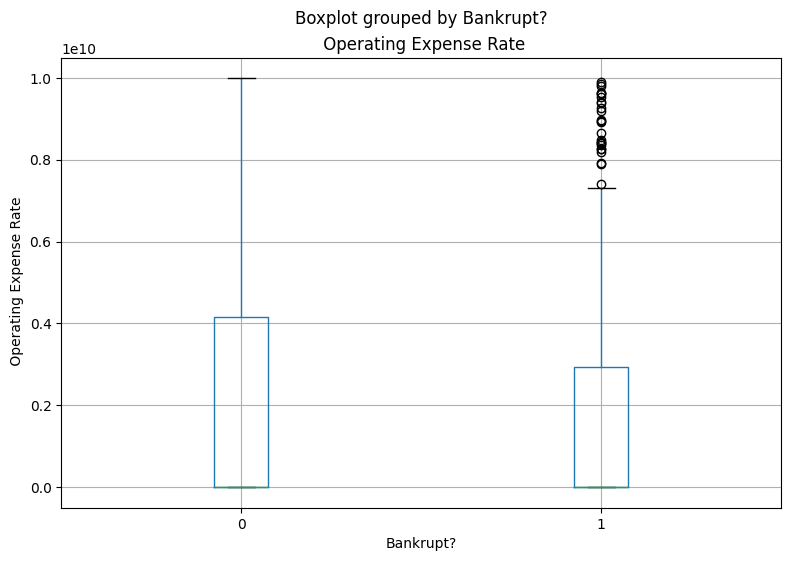

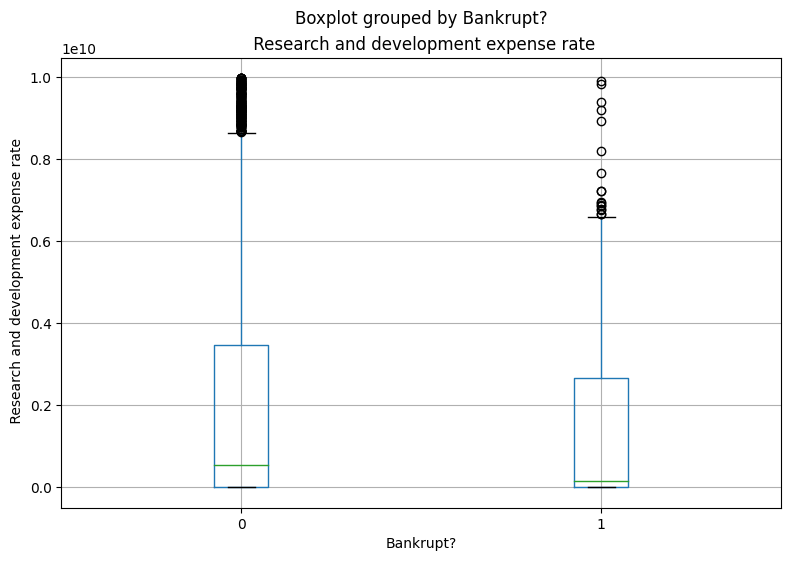

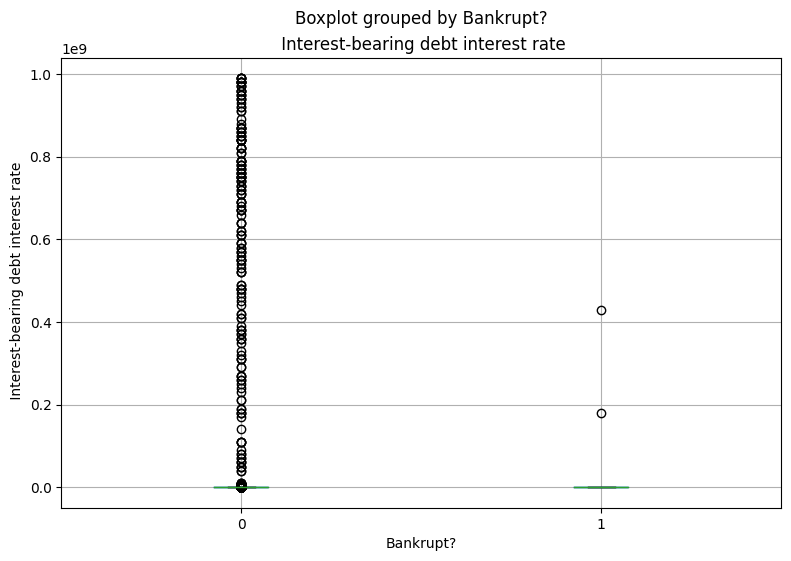

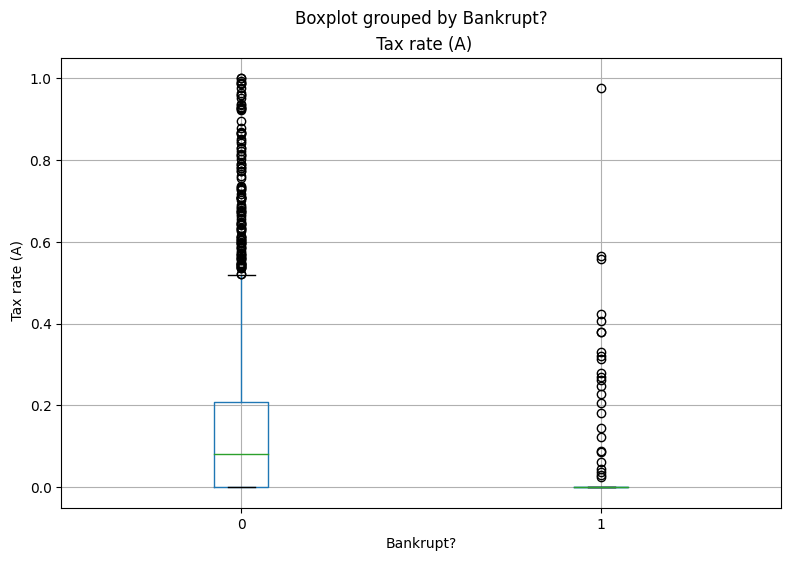

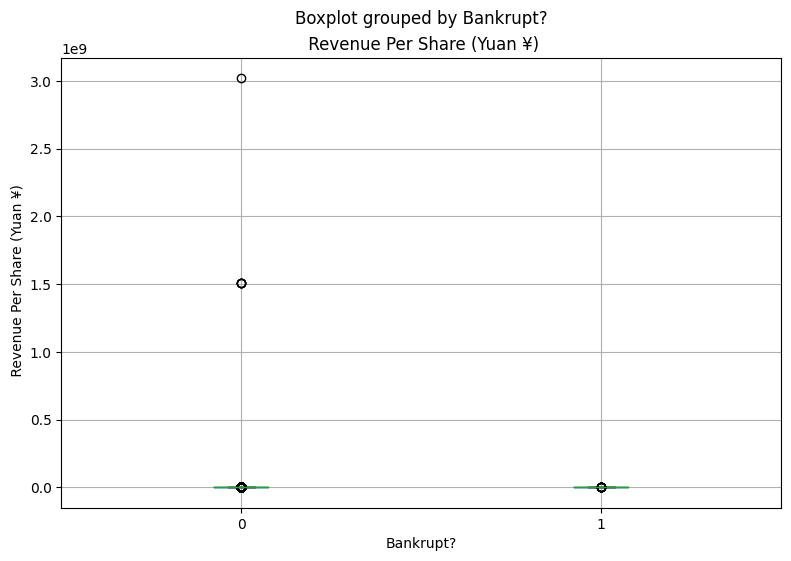

...

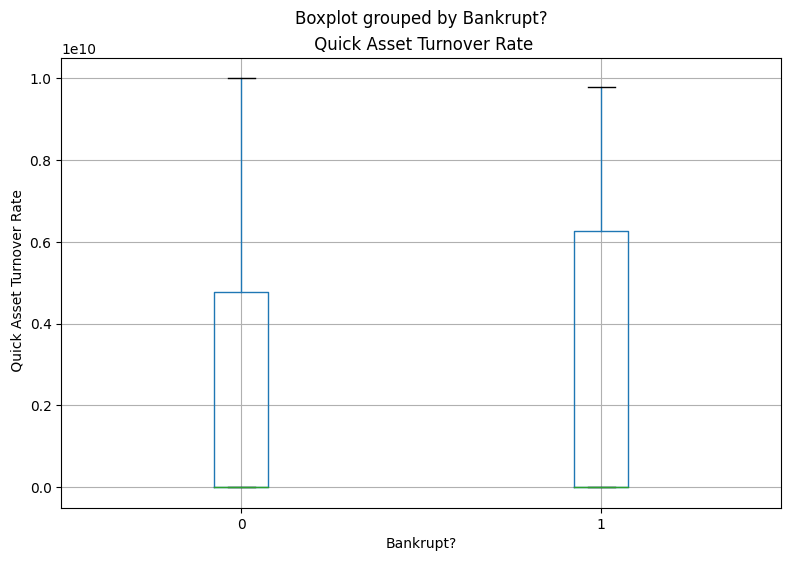

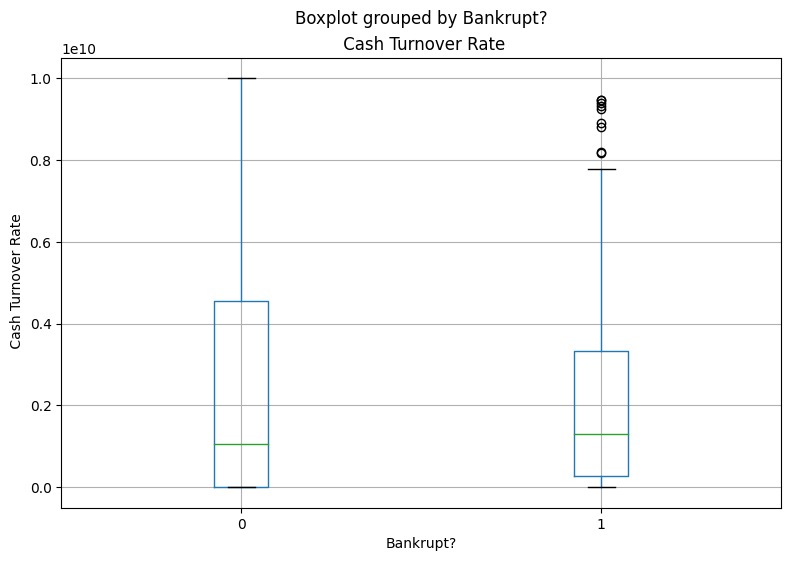

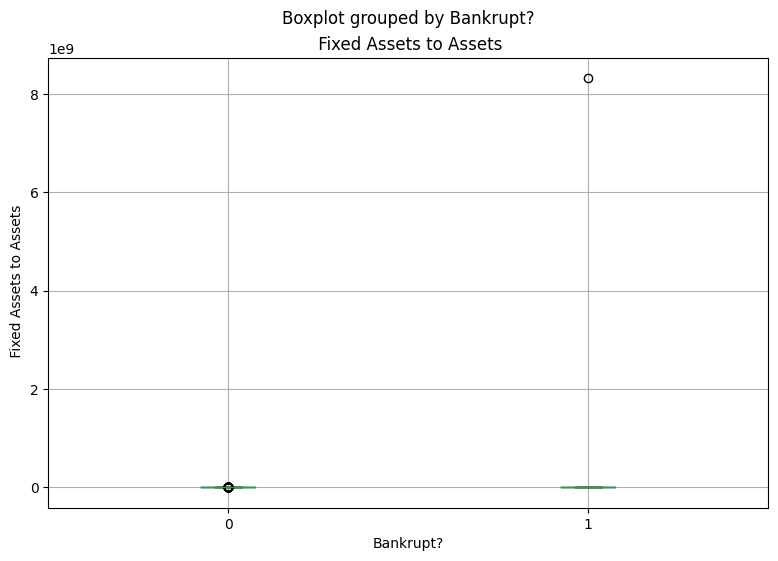

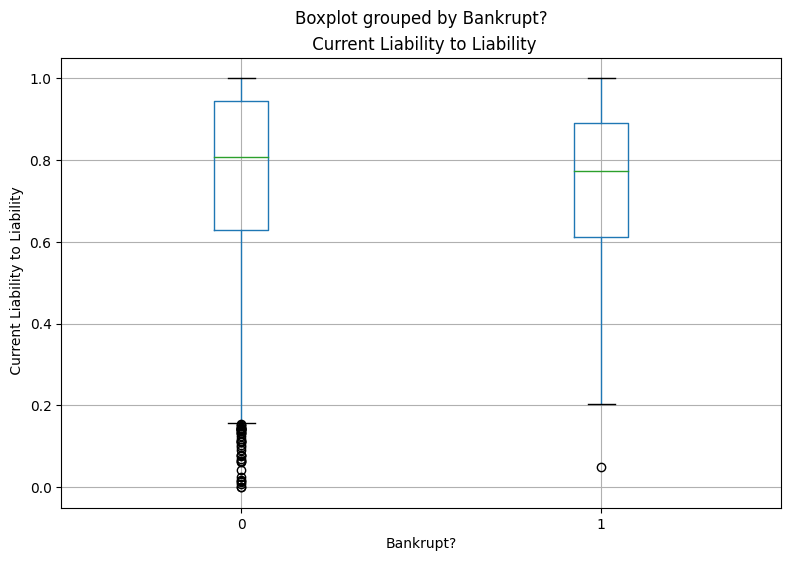

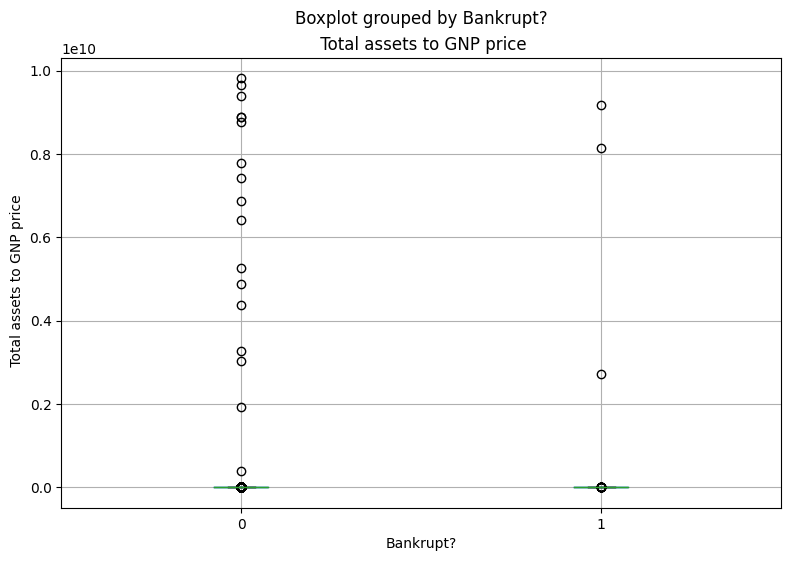

In [ ]:
for i in segregated_list:
  fig=plt.figure(figsize=(9,6))
  ax=fig.gca()
  df.boxplot(column=i, by='Bankrupt?', ax=ax)
  ax.set_ylabel(i)
  plt.show()

Using Information Gain

In [ ]:
#create importances dataframe
importances=mutual_info_classif(X, Y)
importances_df=pd.concat([pd.DataFrame(X.columns), pd.DataFrame(importances)], axis=1)
importances_df.columns=['Features', 'Importances']
importances_df=importances_df.sort_values(by='Importances', ascending=False)

In [ ]:
new_features=importances_df.head(30)
feature_list=new_features.Features.tolist()
len(feature_list)

30

Information Gain Technique reduced the feature size to 30

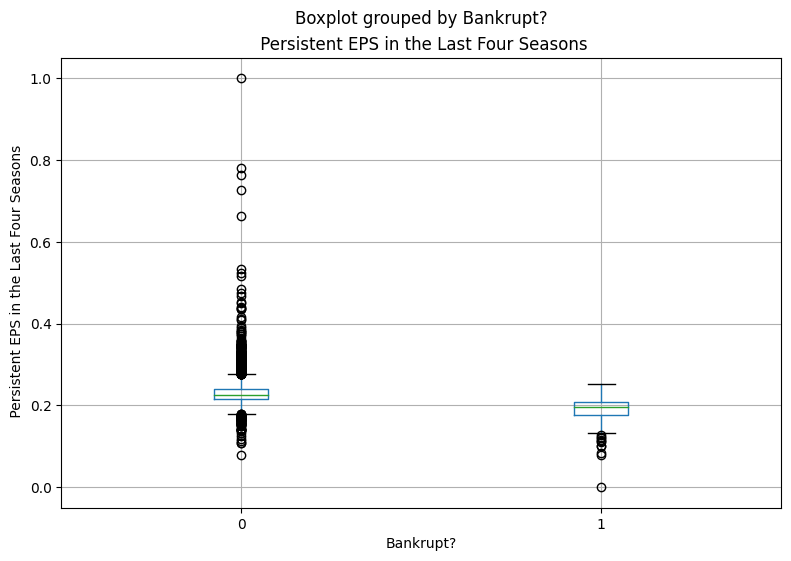

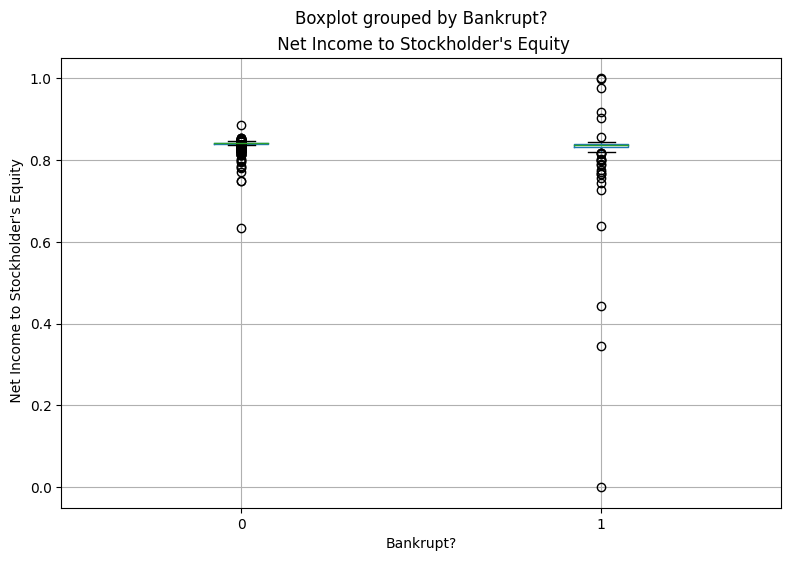

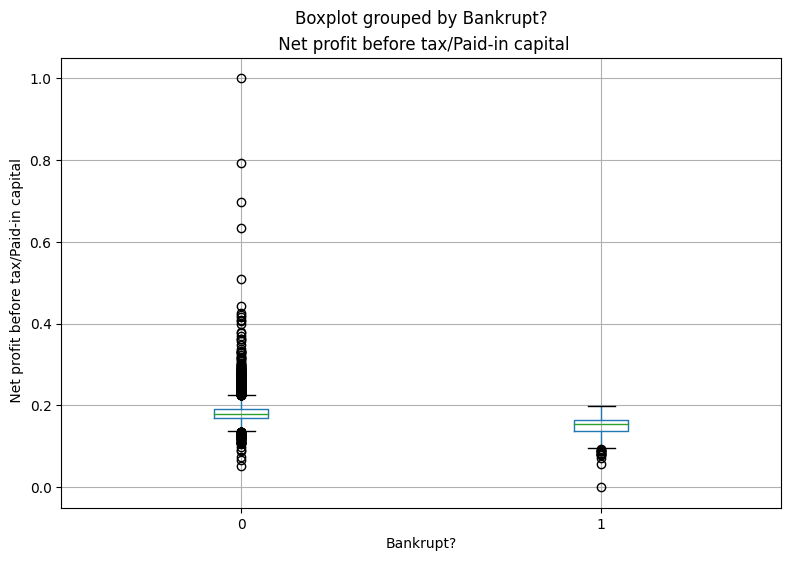

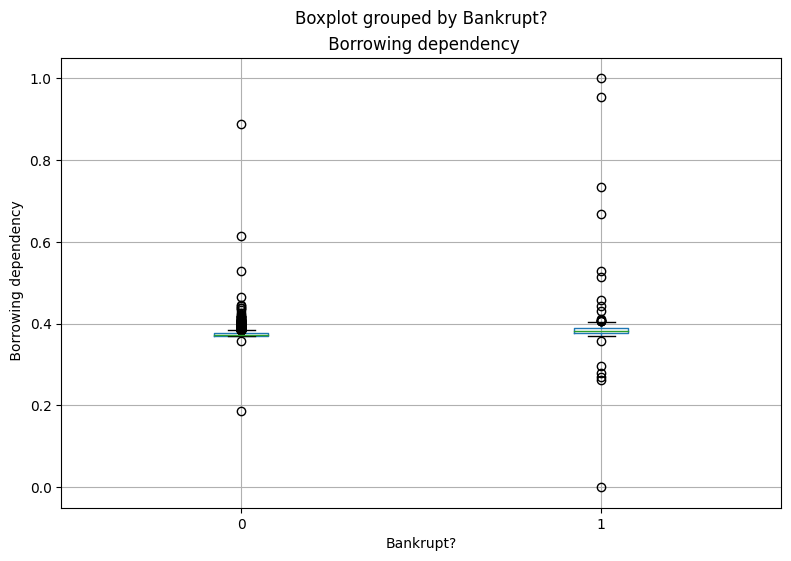

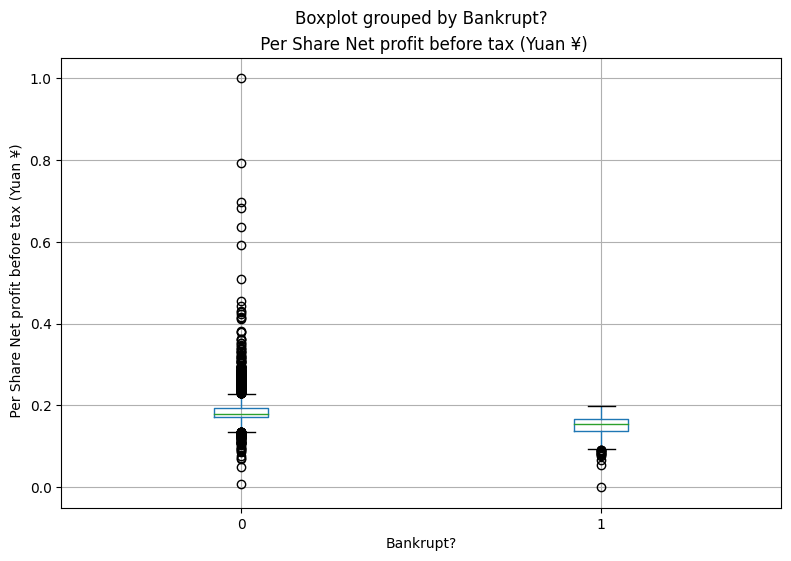

...

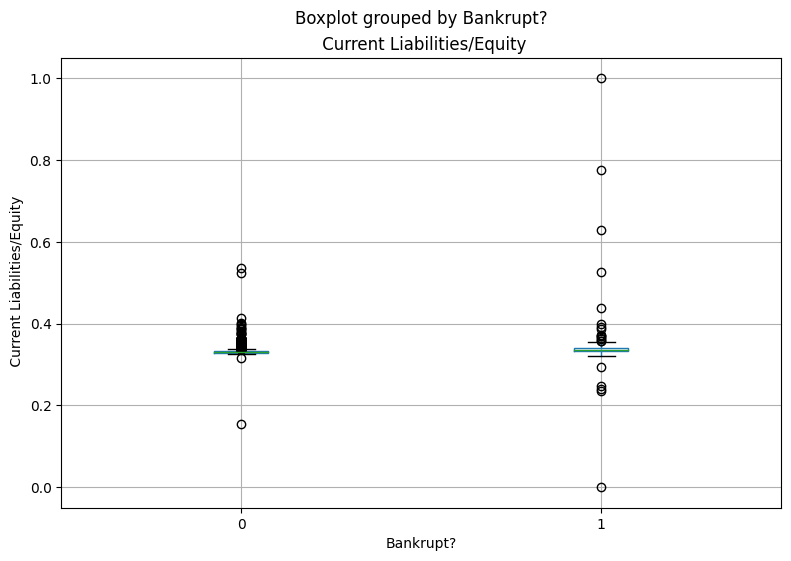

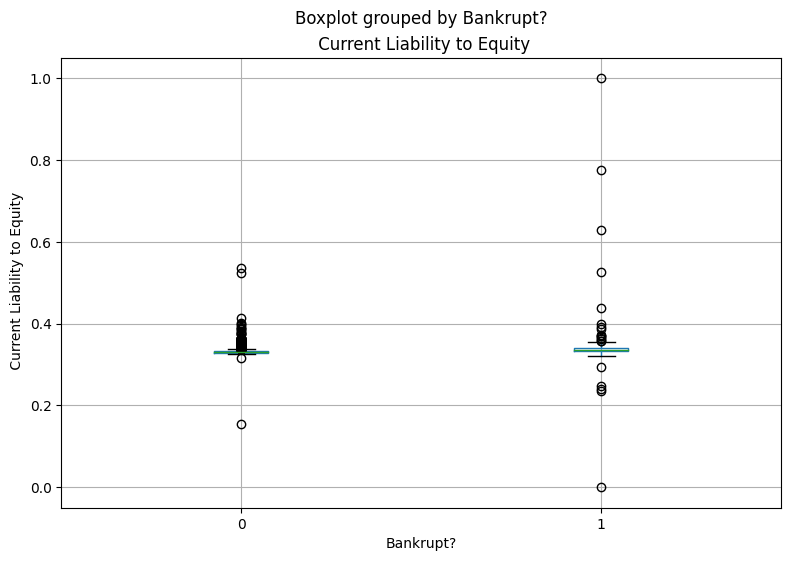

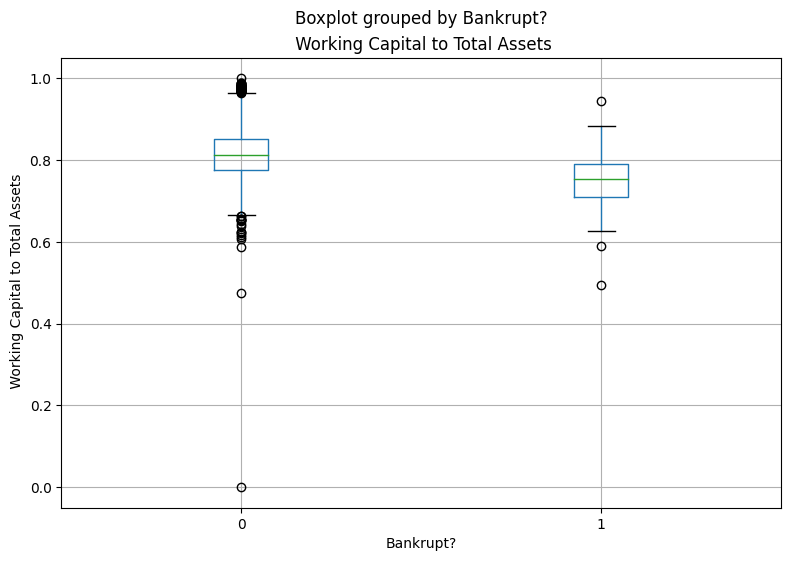

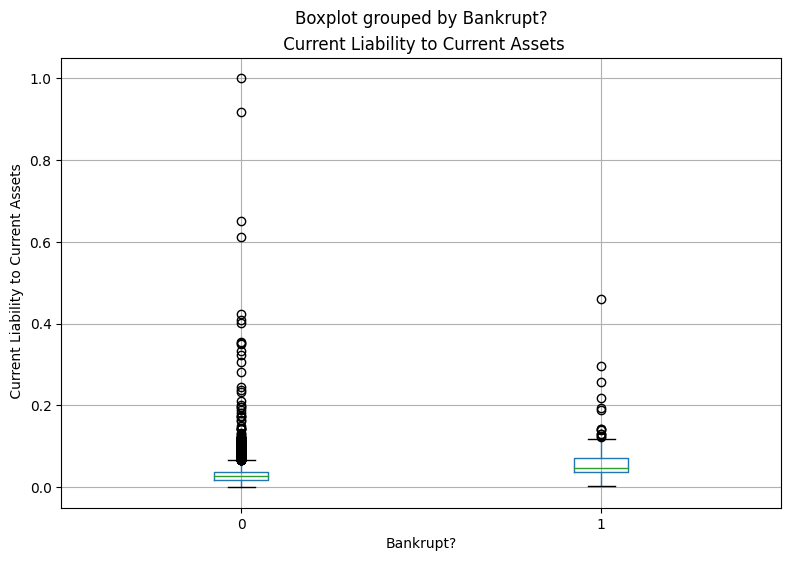

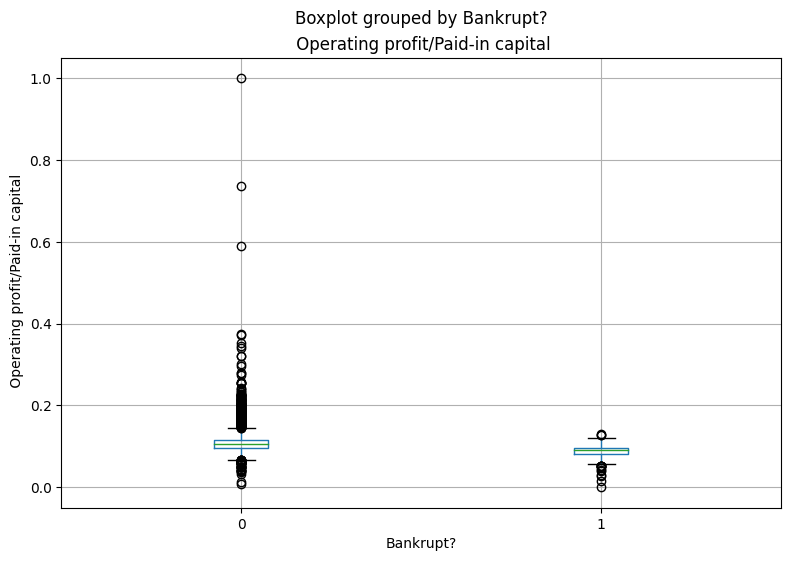

In [ ]:
for i in feature_list:
  fig=plt.figure(figsize=(9,6))
  ax=fig.gca()
  df.boxplot(column=i, by='Bankrupt?', ax=ax)
  ax.set_ylabel(i)
  plt.show()

Using Lasso for Regularization

In [ ]:
X=df.drop(columns=['Bankrupt?'])
Y=df['Bankrupt?']

In [ ]:
X_train, X_test, Y_train, Y_test=train_test_split(X, Y, test_size=0.2, random_state=0)

In [ ]:
X_train.shape

(5455, 93)

In [ ]:
scaler=StandardScaler()
scaler.fit_transform(X_train)

array([[-3.74733362e-01, -1.48488036e-01, -2.62769529e-01, ...,
         7.62963752e-01,  3.82472078e-01, -4.00179045e-01],
       [-1.59511264e-01,  6.03312076e-02, -1.59785265e-01, ...,
        -4.26011925e-02, -2.64053555e-03, -3.70436690e-01],
       [ 4.93520047e-01,  4.24708107e-01,  4.53681340e-01, ...,
        -4.01858278e-02,  1.19519613e-02, -2.35023257e-01],
       ...,
       [ 6.93193781e-01,  7.94157539e-01,  7.12917590e-01, ...,
        -4.43936542e-02, -1.41728777e-02, -8.37254353e-02],
       [ 1.15207463e-02,  3.83282427e-01,  6.23247002e-03, ...,
        -4.43220483e-02, -1.36999597e-02,  3.02406428e+00],
       [ 1.46161032e+00,  1.23715869e+00,  1.29708695e+00, ...,
        -4.38416669e-02, -1.05540979e-02,  2.90729704e-02]])

In [ ]:
sel_=SelectFromModel(Lasso(alpha=0.1))
sel_.fit(X_train, Y_train)
sel_.get_support()

Lasso_feature_scores=pd.DataFrame(sel_.estimator_.coef_,X.columns).reset_index()

l3=Lasso_feature_scores[Lasso_feature_scores[0]!=0].reset_index().loc[:,'index']
len(l3)

24

Lasso Regulation reduced the feature size to 24

In [ ]:
# Using Correlation

def correlation(dataset, threshold):
  col_corr=set()
  corr_matrix=df.corr()
  for i in range(len(corr_matrix.columns)):
    for j in range(i):
      if abs(corr_matrix.iloc[i,j])>threshold:
        colname=corr_matrix.columns[i]
        col_corr.add(colname)
  return col_corr

In [ ]:
corr_features=correlation(X, 0.8)
print('correlated features:', len(set(corr_features)))

correlated features: 25


# **Exploratory Data Analysis 2**

In [ ]:
# Plotting the selected columns to check their distribution

In [ ]:
df2=df.iloc[:,1:].copy()
X=df2
Y=df['Bankrupt?']

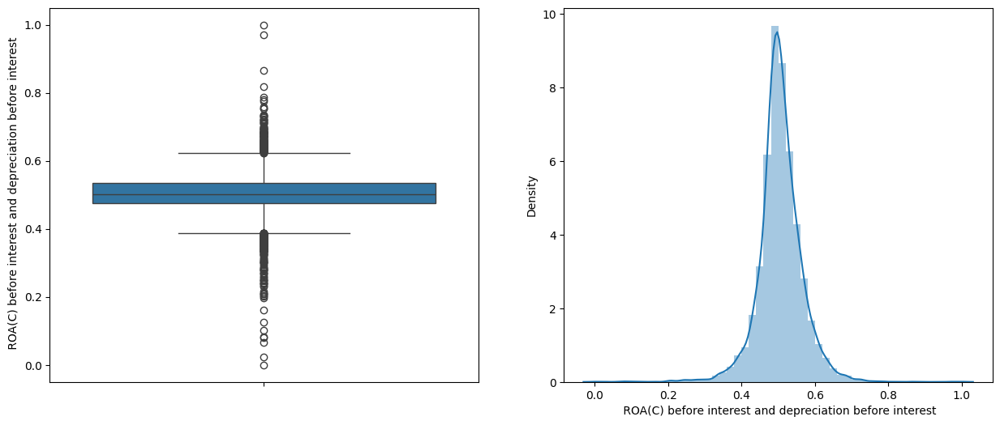

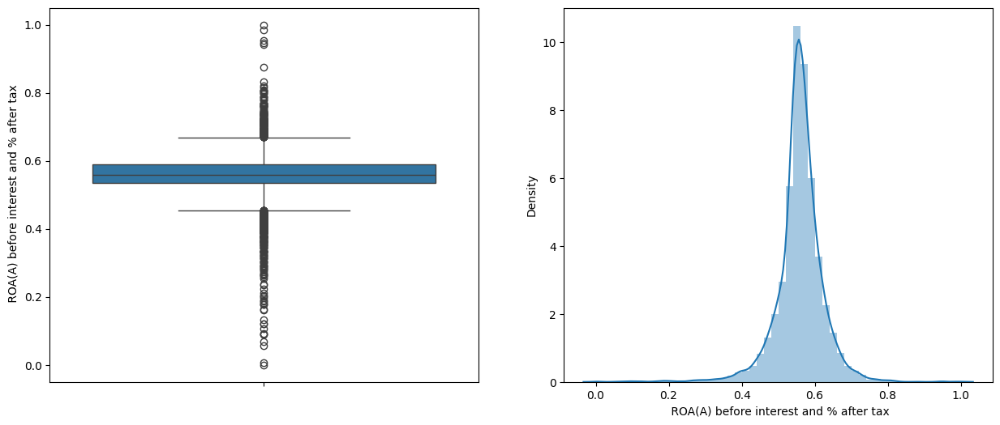

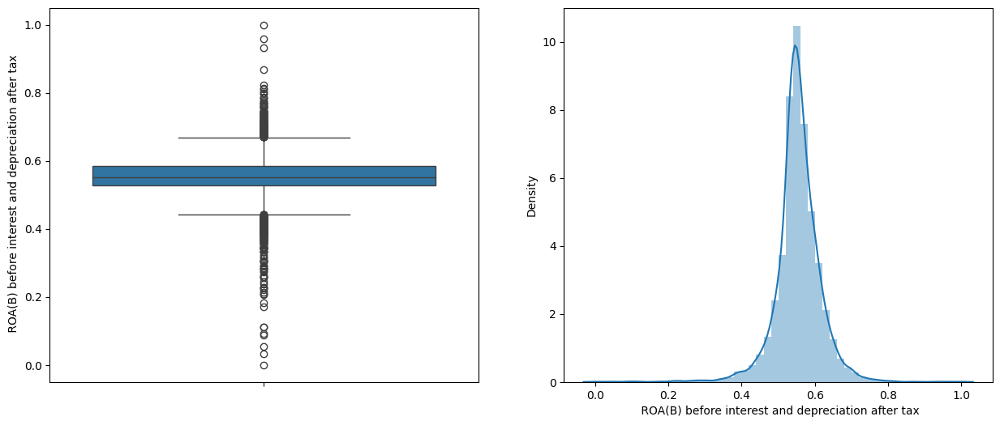

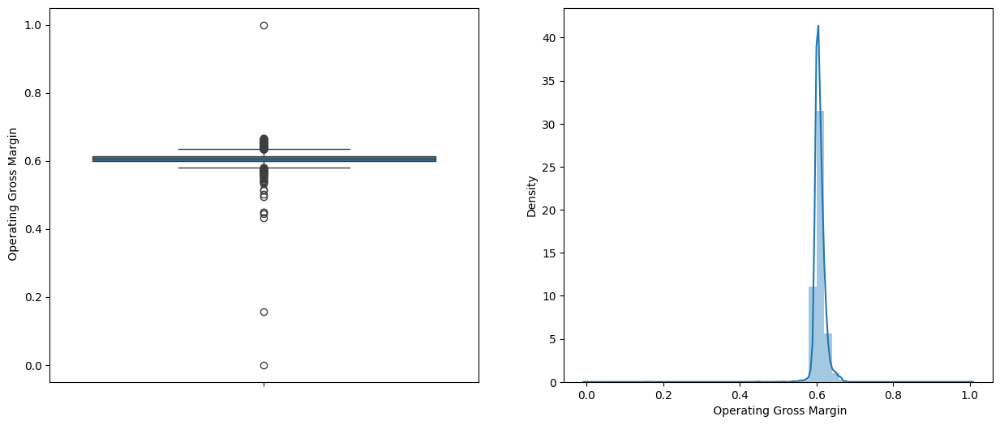

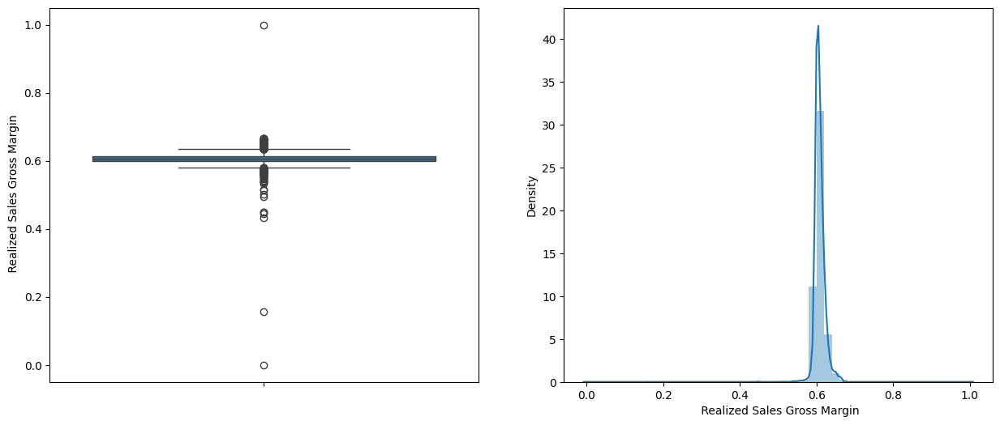

...

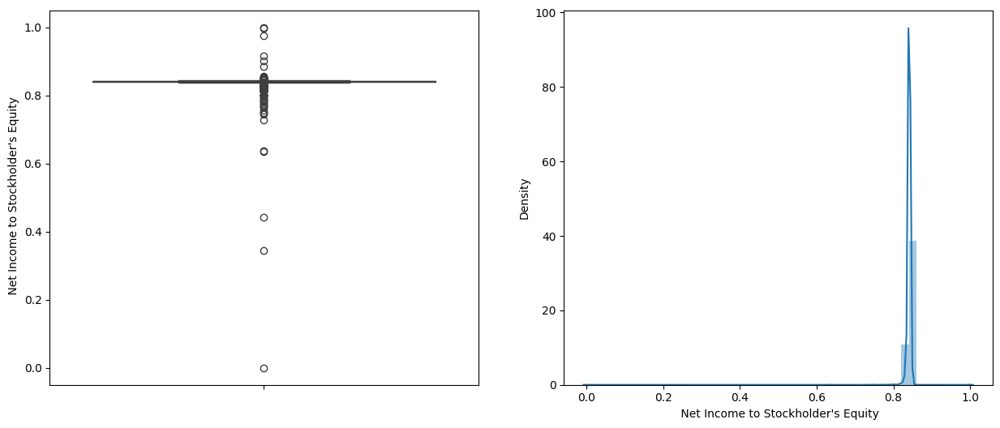

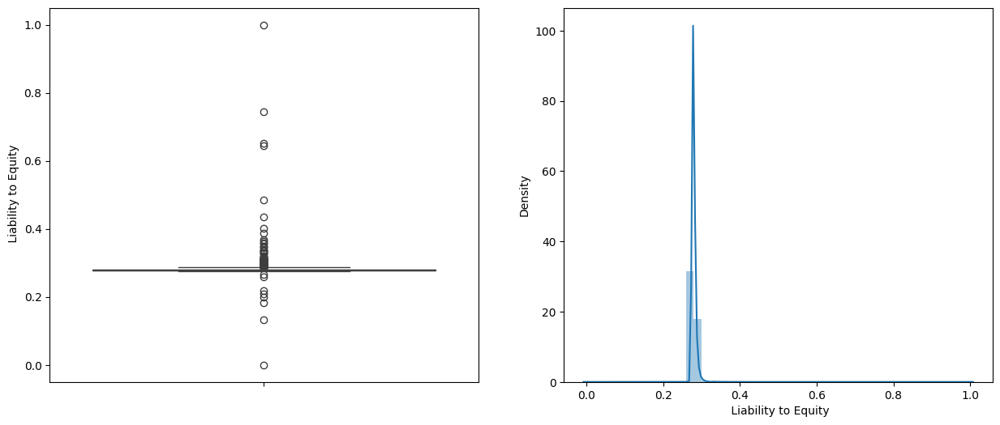

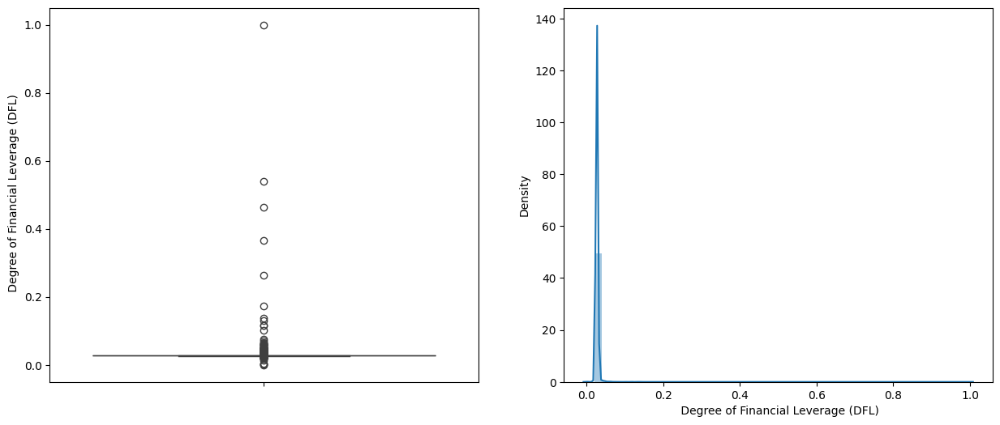

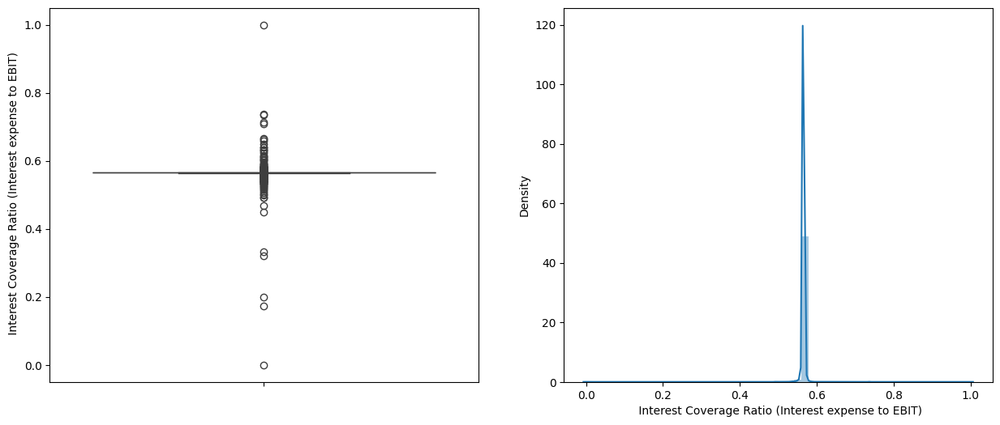

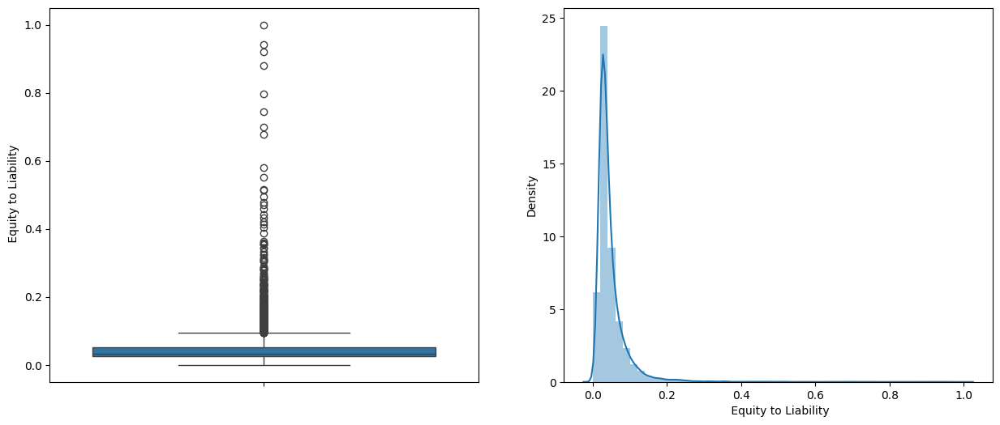

In [ ]:
def plotter():
  for var in columns_after_vif:
    plt.figure(figsize=(15,6))
    plt.subplot(1,2,1)
    fig=sns.boxplot(y=df[var])
    fig.set_title('')
    fig.set_ylabel(var)

    plt.subplot(1,2,2)
    fig=sns.distplot(df[var].dropna())
    fig.set_xlabel(var)

    plt.show()

plotter()

The data has many outliers and is very skewed. Many columns are highly skewed and have high kurtosis.

In [ ]:
# Capping outliers
for col in columns_after_vif:
  upper_lim=df[col].quantile(0.80)
  lower_lim=df[col].quantile(0.20)
  df.loc[(df[col] > upper_lim),col]=upper_lim
  df.loc[(df[col] < lower_lim),col]=lower_lim

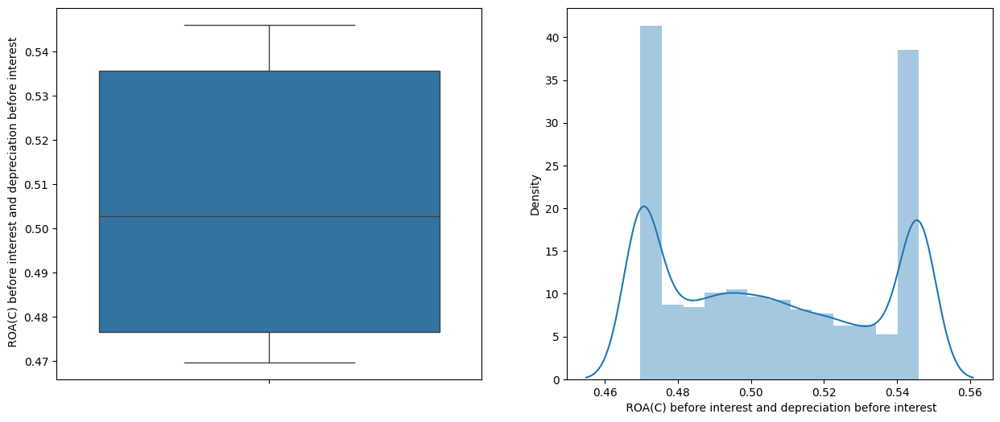

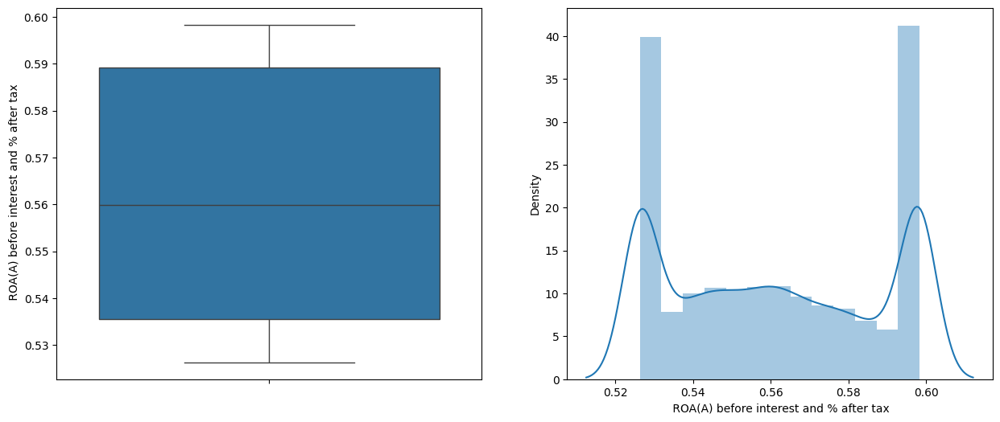

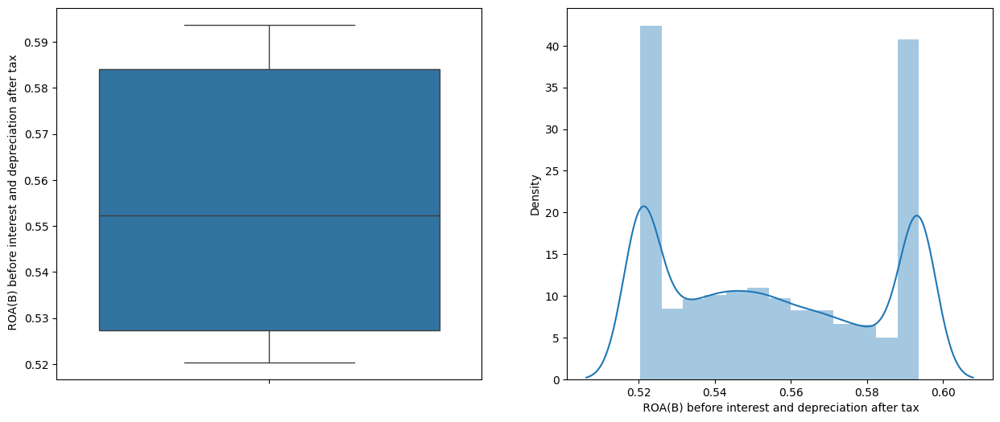

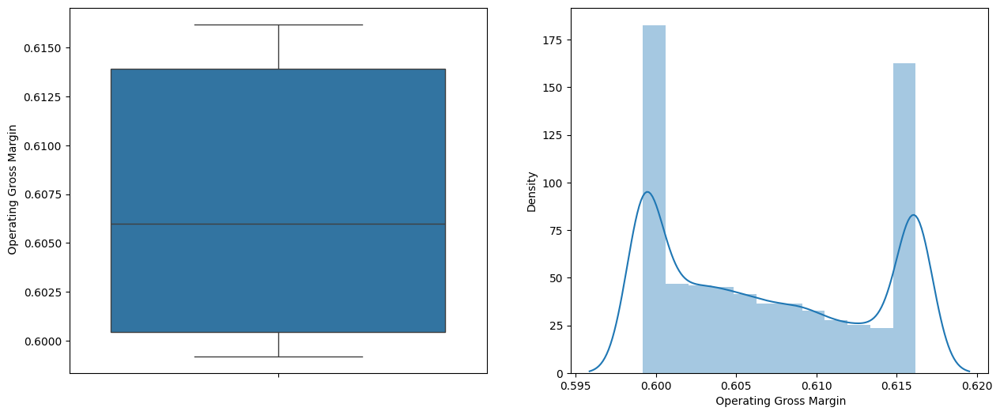

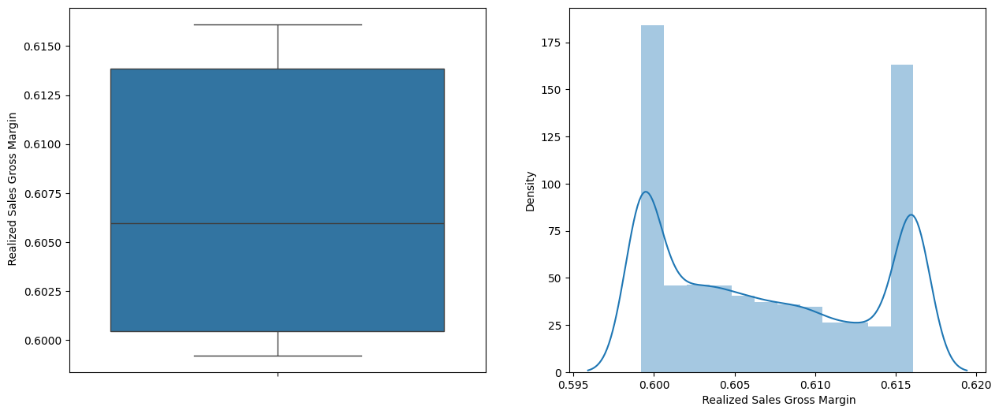

...

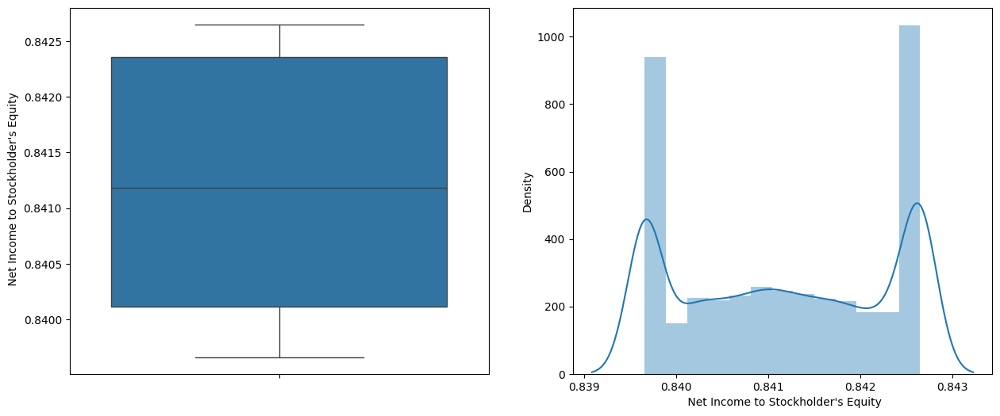

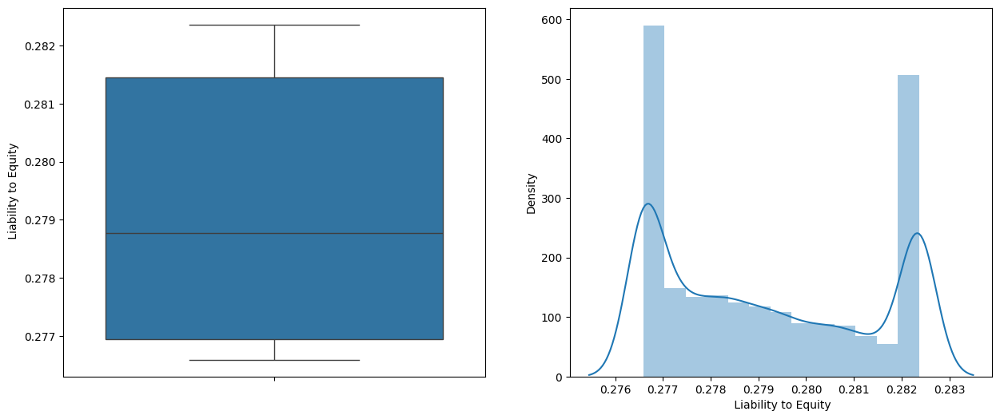

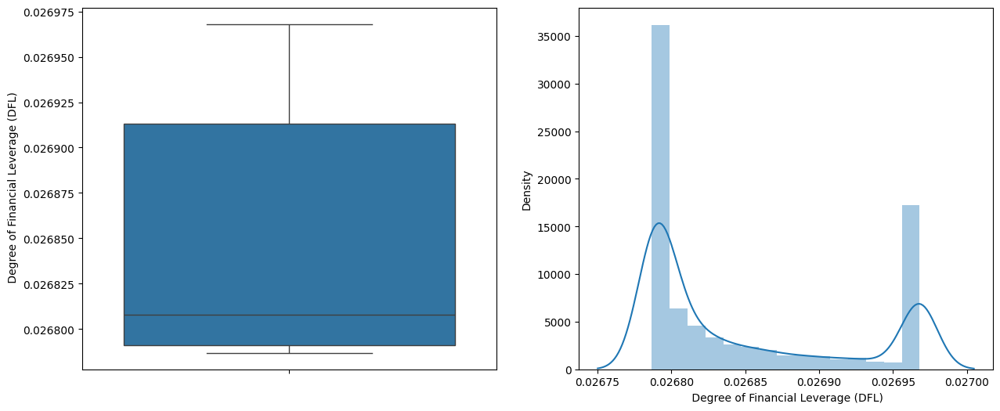

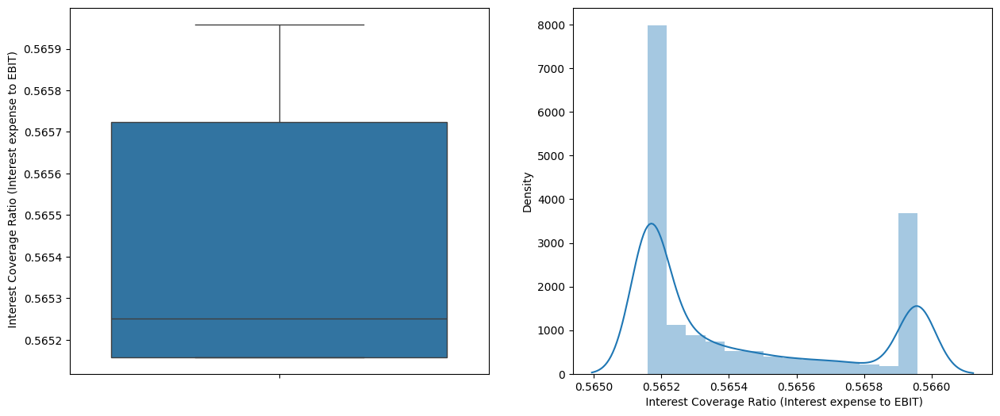

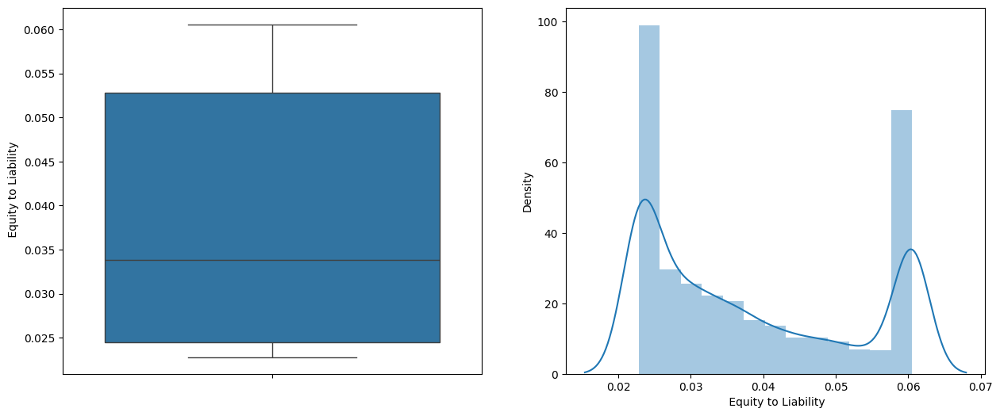

In [ ]:
plotter()

Many columns have distribution with kurtosis greater than normal.

In [ ]:
#correlation using heatmap

In [ ]:
correlation=df.corr(method='pearson')
correlation_with_respect_to_target_variable=correlation.head(3)
correlation_with_respect_to_target_variable

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Current Liability to Current Assets,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Equity to Liability
Bankrupt?,1.000000,-0.197306,-0.202612,-0.197924,-0.128731,-0.128191,-0.164960,-0.196734,-0.199130,-0.192408,...,0.175099,-0.214287,0.063420,-0.105974,-0.128743,-0.198347,0.198436,-0.065618,-0.044436,-0.165796
ROA(C) before interest and depreciation before interest,-0.197306,1.000000,0.917187,0.986242,0.480761,0.478996,0.777398,0.817107,0.804917,0.345096,...,-0.271123,0.907903,-0.036256,0.187893,0.480777,0.880799,-0.258058,-0.083346,-0.128384,0.221419
ROA(A) before interest and % after tax,-0.202612,0.917187,1.000000,0.928143,0.465936,0.463984,0.769194,0.881383,0.883508,0.459321,...,-0.289974,0.989383,-0.015737,0.216578,0.465953,0.967546,-0.245443,-0.067509,-0.120696,0.211873


<Axes: >

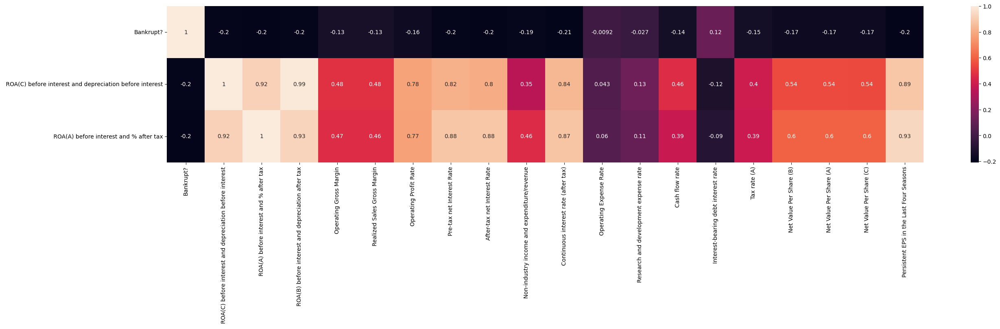

In [ ]:
plt.figure(figsize=(30,5))
sns.heatmap(correlation_with_respect_to_target_variable.iloc[:,0:20], annot=True)

<Axes: >

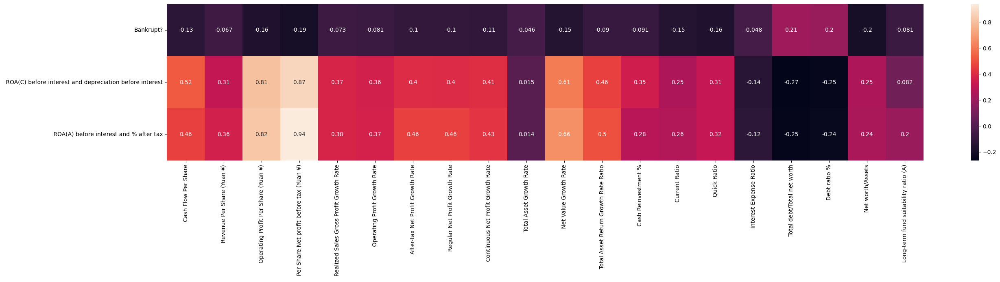

In [ ]:
plt.figure(figsize=(30,5))
sns.heatmap(correlation_with_respect_to_target_variable.iloc[:, 20:40], annot=True)

<Axes: >

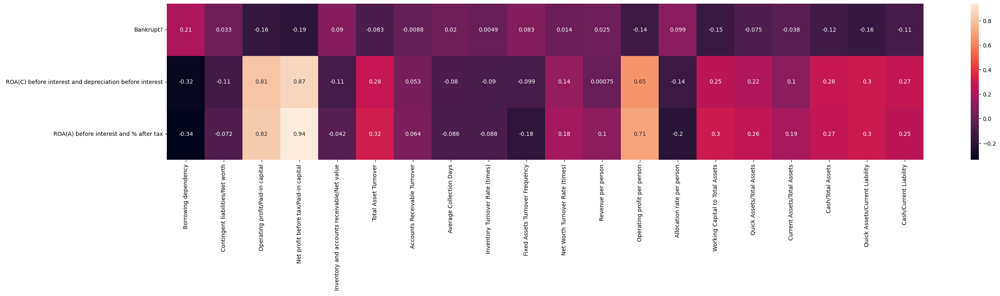

In [ ]:
plt.figure(figsize=(30,5))
sns.heatmap(correlation_with_respect_to_target_variable.iloc[:,40:60], annot=True)

<Axes: >

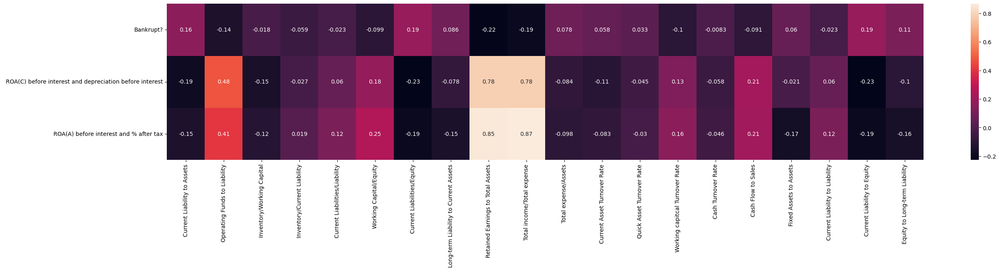

In [ ]:
plt.figure(figsize=(30,5))
sns.heatmap(correlation_with_respect_to_target_variable.iloc[:,60:80], annot=True)

<Axes: >

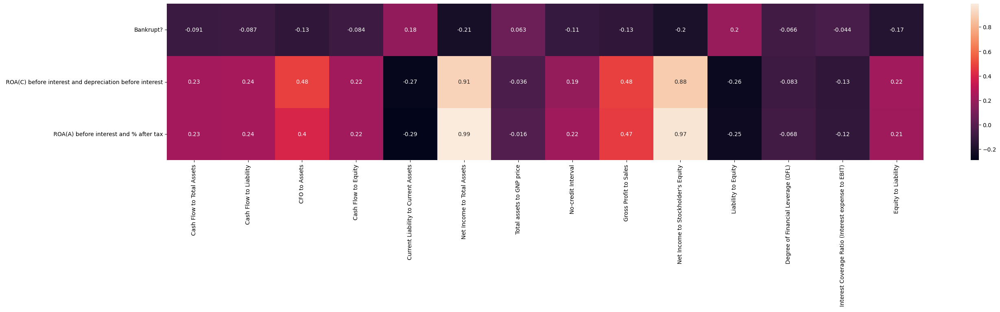

In [ ]:
plt.figure(figsize=(30,5))
sns.heatmap(correlation_with_respect_to_target_variable.iloc[:, 80:100], annot=True)

None of the features displayed any high correlation with the target variable bankruptcy. Most negatively corelated feature was'Net Income to Total Assets'. Most positively corelated feature was 'Debt Ratio'.

With respect to linear algorithms it doesn't provide any modelling power.

In [ ]:
# Anomaly Detection Technique

In [ ]:
# Converting Dataset using StandardScaler
X=df
Y=df['Bankrupt?'].map({0:1,1:-1})

In [ ]:
from sklearn.preprocessing import StandardScaler
st=StandardScaler()


In [ ]:
X1=st.fit_transform(X)
X1

array([[ 5.47681062, -1.24957689, -1.30864917, ..., -0.85651887,
        -0.84207366, -1.07129399],
       [ 5.47681062, -1.24957689, -0.86544112, ...,  1.67877872,
         1.65851219, -1.07129399],
       [ 5.47681062, -1.24957689, -1.30864917, ..., -0.85651887,
        -0.84207366, -1.07129399],
       ...,
       [-0.18258802, -1.14477199, -1.03184708, ..., -0.79690319,
        -0.84207366,  1.53783302],
       [-0.18258802,  0.01822431, -0.05776345, ..., -0.36454204,
        -0.39493153,  0.3938354 ],
       [-0.18258802, -0.43987453,  0.32172329, ..., -0.77176756,
        -0.81536424,  1.53783302]])

In [ ]:
# Train and Test
from sklearn.model_selection import train_test_split
train_X, test_X, train_Y, test_Y = train_test_split(X1, Y, test_size=0.25, random_state=0,stratify=Y )

In [ ]:
train_X.shape, test_X.shape

train_Y.shape, test_Y.shape

test_Y.value_counts()

train_Y.value_counts()


Bankrupt?
 1    4949
-1     165
Name: count, dtype: int64

In [ ]:
# Isolation Forest Model
from sklearn.ensemble import IsolationForest

In [ ]:
clf=IsolationForest(n_estimators=100, max_samples='auto', \
                    max_features=1.0, bootstrap=False, n_jobs=-1, random_state=0, verbose=0, contamination=0.033)
clf.fit(train_X)
pred_train=clf.predict(train_X)

np.unique(pred_train, return_counts=True)

(array([-1,  1]), array([ 169, 4945]))

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import recall_score, roc_auc_score

In [ ]:
target_names=['bankrupt_company', 'normal_company']
print(classification_report(train_Y, pred_train, target_names=target_names))
print('AUC:','{:.1%}'.format(roc_auc_score(train_Y,pred_train)))
cm=confusion_matrix(train_Y, pred_train)

print(cm)

                  precision    recall  f1-score   support

bankrupt_company       0.08      0.08      0.08       165
  normal_company       0.97      0.97      0.97      4949

        accuracy                           0.94      5114
       macro avg       0.52      0.52      0.52      5114
    weighted avg       0.94      0.94      0.94      5114

AUC: 52.4%
[[  13  152]
 [ 156 4793]]


In [ ]:
pred_test=clf.predict(test_X)

target_names2=['bankrupt_company', 'normal_company']
print(classification_report(test_Y, pred_test, target_names=target_names2))
print('AUC:','{:.1%}'.format(roc_auc_score(test_Y, pred_test)))
cm2=confusion_matrix(test_Y, pred_test)

print(cm2)

                  precision    recall  f1-score   support

bankrupt_company       0.06      0.05      0.06        55
  normal_company       0.97      0.97      0.97      1650

        accuracy                           0.94      1705
       macro avg       0.51      0.51      0.51      1705
    weighted avg       0.94      0.94      0.94      1705

AUC: 51.3%
[[   3   52]
 [  47 1603]]


In [ ]:
# Visualizing using PCA

df2=df.iloc[:,1:].copy()

In [ ]:
X=df2
Y=df['Bankrupt?']

bankrupt_index=df[df['Bankrupt?']==1].index
bankrupt_index

Index([   0,    1,    2,    3,    4,    5,   29,   30,   54,   55,
       ...
       6454, 6498, 6499, 6500, 6545, 6591, 6640, 6641, 6642, 6728],
      dtype='int64', length=220)

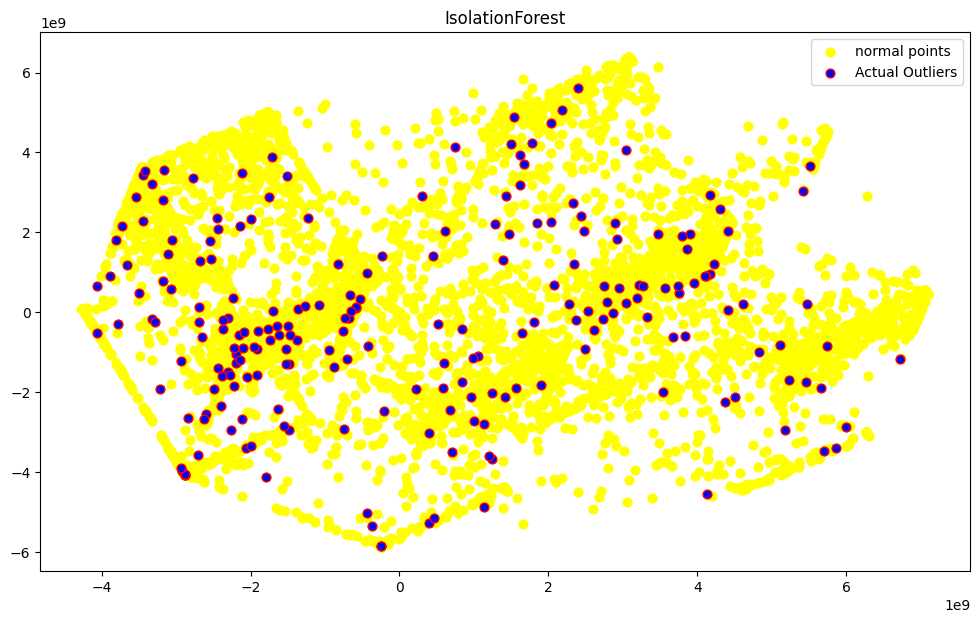

In [ ]:
from sklearn.decomposition import PCA
pca=PCA(2)
pca.fit(X)

res= pd.DataFrame(pca.transform(X))

Z=np.array(res)
figsize=(12,7)
plt.figure(figsize=figsize)
plt.title('IsolationForest')
plt.contourf(Z, cmap=plt.cm.Blues_r)

b1=plt.scatter(res[0], res[1], c='yellow',
               s=40, label='normal points')
b1=plt.scatter(res.iloc[bankrupt_index,0], res.iloc[bankrupt_index, 1], c='blue',
               s=40, edgecolor='red', label='Actual Outliers')
plt.legend(loc='upper right')
plt.show()


Classes are interwined and overlapping. Thus, Bankruptcy isn't an anomaly.

# **Model Testing**

In [ ]:
# testing differnt models at a time with differnt sets of selected features
report=pd.DataFrame(columns=['logistic_regression','random_forest','easy_ensemble',
                             'SVM','gaussian_naive_bayes', 'KNN'])

In [ ]:
# Generating Evalution Matrix
def evaluator(Y_acc_test,Y_acc_train,Y_predicts_test,Y_predicts_train,classifier_name,Y_test_prob,Y_train_prob):
  train_accuracy=accuracy_score(Y_acc_train,Y_predicts_train)
  test_accuracy=accuracy_score(Y_acc_test,Y_predicts_test)

  train_cm=confusion_matrix(Y_acc_train,Y_predicts_train)
  test_cm=confusion_matrix(Y_acc_test, Y_predicts_test)

  prec_train=train_cm[1][1]/(train_cm[1][1]+ train_cm[0][1])
  prec_test=test_cm[1][1]/(test_cm[1][1]+ test_cm[0][1])

  recall_train=train_cm[1][1]/(train_cm[1][0]+train_cm[1][1])
  recall_test=test_cm[1][1]/(test_cm[1][0]+test_cm[1][1])

  f1_train=(2*prec_train*recall_train)/(recall_train+prec_train)
  f1_test=(2*prec_test*recall_test)/(recall_test+prec_test)

  auc_train=roc_auc_score(Y_acc_train, Y_train_prob)
  auc_test=roc_auc_score(Y_acc_test, Y_test_prob)

  eval_list=[test_accuracy, train_accuracy,prec_test,prec_train,recall_test,
             recall_train,f1_test,f1_train,auc_test,auc_train]

  report[classifier_name]=eval_list


In [ ]:
!pip install scikit-learn

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV, RepeatedStratifiedKFold

In [ ]:
def model_result(train_X,train_Y,test_X,test_Y):

  # Logistic Regression

  model=LogisticRegression(class_weight='balanced',C=0.01)

  solvers=['lbfgs']
  penalty=['l2']
  c_values=[100, 10, 1.0, 0.1, 0.01]

  grid=dict(solver=solvers, penalty=penalty, C=c_values)
  cv=RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=100)
  grid_search=GridSearchCV(estimator=model,param_grid=grid, n_jobs=-1, cv=cv,scoring='accuracy',error_score=0)
  grid_result=grid_search.fit(train_X,train_Y)

  model=grid_result.best_estimator_

  lr_class_train_pred=model.predict(train_X)
  lr_class_test_pred=model.predict(test_X)

  lr_prob_train_pred=model.predict_proba(train_X)[:,1]
  lr_prob_test_pred=model.predict_proba(test_X)[:,1]


  # Random Forest

  n_estimators=[100,150]
  max_depth=[4,6,8]
  min_samples_split=[50,100,150]
  min_samples_leaf=[40,50]
  param_dict={'n_estimators':n_estimators,
               'max_depth':max_depth,
               'min_samples_split':min_samples_split,
               'min_samples_leaf': min_samples_leaf}
  rf_model=RandomForestClassifier(class_weight='balanced')

  rf_grid=GridSearchCV(estimator=rf_model,
                        param_grid=param_dict,
                        cv=5,verbose=2, scoring='roc_auc')
  rf_grid.fit(train_X,train_Y)

  model=rf_grid.best_estimator_

  rf_class_train_pred=model.predict(train_X)
  rf_class_test_pred=model.predict(test_X)

  rf_prob_train_pred=model.predict_proba(train_X)[:,1]
  rf_prob_test_pred=model.predict_proba(test_X)[:,1]


  # Easy Ensemble

  balbag=EasyEnsembleClassifier(base_estimator=RandomForestClassifier(class_weight='balanced'),
                                n_estimators=50, sampling_strategy='majority',
                                replacement=True, n_jobs=-1, random_state=5)
  model_full_sample=balbag.fit(train_X, train_Y)

  ee_class_train_pred=model_full_sample.predict(train_X)
  ee_class_test_pred=model_full_sample.predict(test_X)

  ee_prob_train_pred=model_full_sample.predict_proba(train_X)[:,1]
  ee_prob_test_pred=model_full_sample.predict_proba(test_X)[:,1]


  # SVM

  svm_clf=SVC(probability=True, kernel='linear', class_weight='balanced')
  svm_clf.fit(train_X,train_Y)

  svm_class_train_pred=svm_clf.predict(train_X)
  svm_class_test_pred=svm_clf.predict(test_X)

  svm_prob_train_pred=svm_clf.predict_proba(train_X)[:,1]
  svm_prob_test_pred=svm_clf.predict_proba(test_X)[:,1]


  # Naive Bayes

  nbc=GaussianNB().fit(train_X,train_Y)
  nbc_class_train_pred=nbc.predict(train_X)
  nbc_class_test_pred=nbc.predict(test_X)
  nbc_prob_train_pred=svm_clf.predict_proba(train_X)[:,1]
  nbc_prob_test_pred=svm_clf.predict_proba(test_X)[:,1]

  # KNN

  knn=KNeighborsClassifier(n_neighbors=2,weights='uniform').fit(train_X,train_Y)
  knn_class_train_pred=knn.predict(train_X)
  knn_class_test_pred=knn.predict(test_X)

  knn_prob_train_pred=knn.predict_proba(train_X)[:,1]
  knn_prob_test_pred=knn.predict_proba(test_X)[:,1]

  # Evalution Function

  evaluator(test_Y,train_Y,lr_class_test_pred,lr_class_train_pred,'logistic_regression',lr_prob_test_pred,lr_prob_train_pred)
  evaluator(test_Y,train_Y,rf_class_test_pred,rf_class_train_pred,'random_forest',rf_prob_test_pred,rf_prob_train_pred)
  evaluator(test_Y,train_Y,ee_class_test_pred,ee_class_train_pred,'easy_ensemble',ee_prob_test_pred,ee_prob_train_pred)
  evaluator(test_Y,train_Y,svm_class_test_pred,svm_class_train_pred,'SVM',svm_prob_test_pred,svm_prob_train_pred)
  evaluator(test_Y,train_Y,nbc_class_test_pred,nbc_class_train_pred,'gaussian_naive_bayes',nbc_prob_test_pred,nbc_prob_train_pred)
  evaluator(test_Y,train_Y,knn_class_test_pred,knn_class_train_pred,'KNN',knn_prob_test_pred,knn_prob_train_pred)





In [ ]:
X.shape

(6819, 93)

In [ ]:
!pip install scipy

In [ ]:
import scipy.optimize
import traceback

In [ ]:
print(traceback.format_exc())

NoneType: None



**Using Quasi Method**

In [ ]:
skewness=PowerTransformer(standardize=False)
X=pd.DataFrame(skewness.fit_transform(X[segregated_list]),columns=segregated_list)

In [ ]:
X_train,X_test,Y_train,Y_test=train_test_split(X,Y,test_size=0.25,stratify=Y)

In [ ]:
scaler=StandardScaler()
X_train=scaler.fit_transform(X_train)
X_test=scaler.transform(X_test)

In [ ]:
model_result(X_train,Y_train,X_test,Y_test)

Fitting 5 folds for each of 36 candidates, totalling 180 fits
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=100; total time=   0.9s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=100; total time=   0.6s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=100; total time=   0.7s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=100; total time=   0.8s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=100; total time=   0.7s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=150; total time=   1.1s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=150; total time=   1.9s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=150; total time=   1.7s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=150; total time=   2.2s
[CV] END max_depth=4

In [ ]:
report

,logistic_regression,random_forest,easy_ensemble,SVM,gaussian_naive_bayes,KNN
0,0.838123,0.913196,0.825806,0.832258,0.828152,0.965982
1,0.837114,0.924521,0.845522,0.833790,0.836136,0.974189
2,0.155763,0.243094,0.150289,0.151057,0.134969,0.363636
3,0.150628,0.287091,0.172775,0.148718,0.134636,1.000000
4,0.909091,0.800000,0.945455,0.909091,0.800000,0.072727
5,0.872727,0.903030,1.000000,0.878788,0.751515,0.200000
6,0.265957,0.372881,0.259352,0.259067,0.230971,0.121212
7,0.256913,0.435673,0.294643,0.254386,0.228361,0.333333
8,0.933278,0.943438,0.947488,0.933455,0.933455,0.683135
9,0.928319,0.973835,0.992080,0.926002,0.926002,0.992160


0=test_acc,  1=train_acc,  2=test_precision,  3=train_precision,  4 =test_recall, 5=train_recall, 6=test_f1_score,  7=train_f1_score  8=test_auc, 9=train_auc  

# **Model Testing LR**

In [ ]:
import imblearn
from collections import Counter
from imblearn.over_sampling import SMOTE

In [ ]:
smote=SMOTE(random_state=8)

In [ ]:
X_train, Y_train=smote.fit_resample(X_train,Y_train)
X_test, Y_test=smote.fit_resample(X_test,Y_test)

In [ ]:
print(Counter(Y_train))
print(Counter(Y_test))

Counter({0: 4949, 1: 4949})
Counter({0: 1650, 1: 1650})


In [ ]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()

In [ ]:
X_train=sc.fit_transform(X_train)
X_test=sc.transform(X_test)

**LR With PCA**

In [ ]:
from sklearn.decomposition import PCA

In [ ]:
pca=PCA(n_components=2)

In [ ]:
X_train=pca.fit_transform(X_train)
X_test=pca.transform(X_test)

explained_variance=pca.explained_variance_ratio_
explained_variance

array([0.25343742, 0.14027354])

In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
reg=0.01

lgr_classifier=LogisticRegression(C=1/reg,solver='liblinear')

lgr_classifier.fit(X_train,Y_train)

LogisticRegression(C=100.0, solver='liblinear')

In [ ]:
predictions_val=lgr_classifier.predict(X_test)
predictions_train=lgr_classifier.predict(X_train)

In [ ]:
print('Validation Predicted Labels:', predictions_val)
print('Validation Actual Labels:', Y_train)

Validation Predicted Labels: [0 0 0 ... 1 1 1]
Validation Actual Labels: 0       0
1       0
2       0
3       0
4       0
       ..
9893    1
9894    1
9895    1
9896    1
9897    1
Name: Bankrupt?, Length: 9898, dtype: int64


In [ ]:
print('Training Predicted Labels:', predictions_train)
print('Training Actual Labels:', Y_train)

Training Predicted Labels: [0 0 0 ... 0 1 0]
Training Actual Labels: 0       0
1       0
2       0
3       0
4       0
       ..
9893    1
9894    1
9895    1
9896    1
9897    1
Name: Bankrupt?, Length: 9898, dtype: int64


In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.metrics import precision_score,recall_score
from sklearn.metrics import roc_curve,roc_auc_score

In [ ]:
print('Acc for Val data:', accuracy_score(Y_test,predictions_val))
print('Acc for train data:', accuracy_score(Y_train,predictions_train))

Acc for Val data: 0.7906060606060606
Acc for train data: 0.7618710850676904


In [ ]:
from sklearn.metrics import classification_report

In [ ]:
print('Validation Data Classification Report \n', classification_report(Y_test, predictions_val))
print('Train Data Classification Report \n', classification_report(Y_train,predictions_train))

Validation Data Classification Report 
               precision    recall  f1-score   support

           0       0.87      0.68      0.76      1650
           1       0.74      0.90      0.81      1650

    accuracy                           0.79      3300
   macro avg       0.81      0.79      0.79      3300
weighted avg       0.81      0.79      0.79      3300

Train Data Classification Report 
               precision    recall  f1-score   support

           0       0.80      0.69      0.74      4949
           1       0.73      0.83      0.78      4949

    accuracy                           0.76      9898
   macro avg       0.77      0.76      0.76      9898
weighted avg       0.77      0.76      0.76      9898



In [ ]:
from sklearn.metrics import f1_score

In [ ]:
print('F1 Score over Validation Data', f1_score(Y_test, predictions_val))
print('F1 Score over Test Data', f1_score(Y_train, predictions_train))

F1 Score over Validation Data 0.8113568113568115
F1 Score over Test Data 0.7771158392434988


In [ ]:
from sklearn.metrics import precision_score, recall_score

In [ ]:
print('Validation Data Metrics\n')
print('Overall Precision:', precision_score(Y_test, predictions_val))
print('Overall Recall:', recall_score(Y_test, predictions_val))
print('\nTrain Data Metrics\n')
print('Overall Precision:', precision_score(Y_train, predictions_train))
print('Overall Recall:', recall_score(Y_train, predictions_train))

Validation Data Metrics

Overall Precision: 0.7382016890213612
Overall Recall: 0.9006060606060606

Train Data Metrics

Overall Precision: 0.7303590472804835
Overall Recall: 0.8302687411598303


In [ ]:
from sklearn.metrics import confusion_matrix

In [ ]:
print('\nValidation Data Confusion Matrix')
val_cm=confusion_matrix(Y_test, predictions_val)
print(val_cm)


Validation Data Confusion Matrix
[[1123  527]
 [ 164 1486]]


In [ ]:
print('\nTrain Data Confusion Matrix')
train_cm=confusion_matrix(Y_train, predictions_train)
print(train_cm)


Train Data Confusion Matrix
[[3432 1517]
 [ 840 4109]]


In [ ]:
Y_val_scores=lgr_classifier.predict_proba(X_test)
print(Y_val_scores)

Y_train_scores=lgr_classifier.predict_proba(X_train)
print(Y_train_scores)

[[0.91620782 0.08379218]
 [0.96406513 0.03593487]
 [0.5650582  0.4349418 ]
 ...
 [0.19857702 0.80142298]
 [0.33115364 0.66884636]
 [0.22474783 0.77525217]]
[[0.80893977 0.19106023]
 [0.96355771 0.03644229]
 [0.69037129 0.30962871]
 ...
 [0.89479258 0.10520742]
 [0.33412571 0.66587429]
 [0.81767211 0.18232789]]


In [ ]:
from sklearn.metrics import roc_curve
from sklearn.metrics import confusion_matrix
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

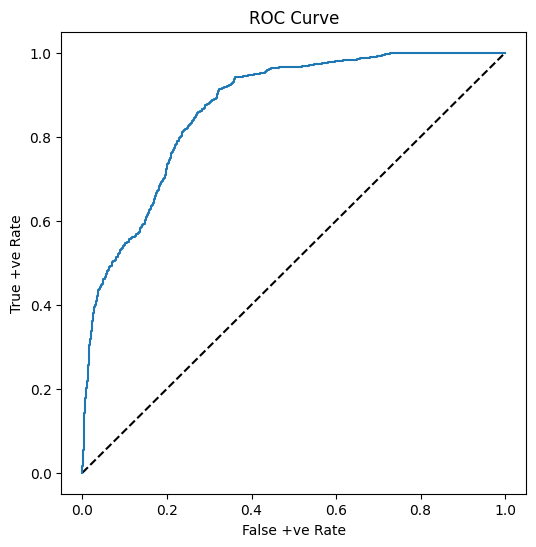

In [ ]:
# Plot ROC Curve
fpr, tpr, thresholds=roc_curve(Y_test, Y_val_scores[:, 1])

fig=plt.figure(figsize=(6,6))
plt.plot([0,1],[0,1],'k--')
plt.plot(fpr,tpr)
plt.xlabel('False +ve Rate')
plt.ylabel('True +ve Rate')
plt.title('ROC Curve')
plt.show()

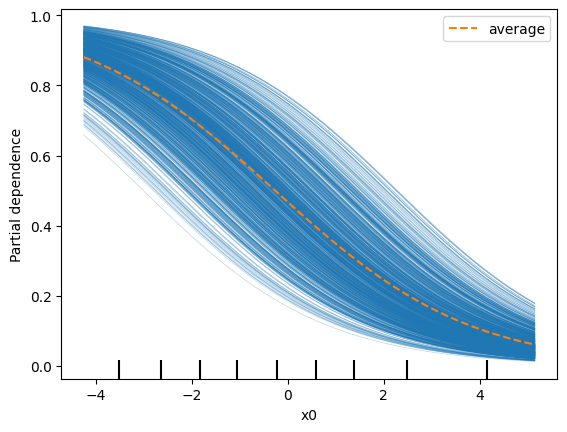

In [ ]:
from sklearn.inspection import PartialDependenceDisplay
features=[0]
PartialDependenceDisplay.from_estimator(lgr_classifier, X_train,features, kind='both')

<Axes: title={'center': 'Feature Importance'}>

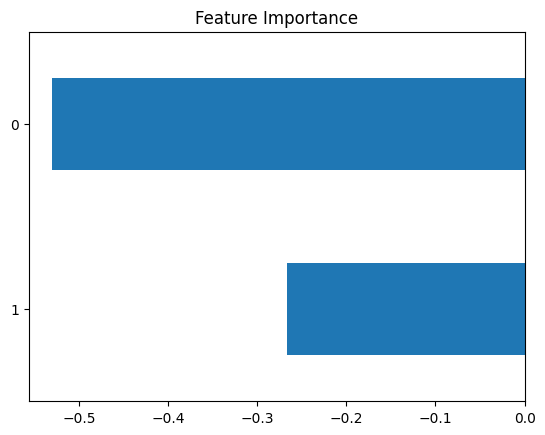

In [ ]:
from sklearn.inspection import permutation_importance
importance=lgr_classifier.coef_[0]
feat_importances=pd.Series(importance)
feat_importances.nlargest(20).plot(kind='barh',title='Feature Importance')

# **Model Testing SVM**

In [ ]:
from sklearn.svm import SVC

In [ ]:
svm_clf=SVC(kernel='rbf', probability=True, random_state=0)
svm_clf=svm_clf.fit(X_train, Y_train)

In [ ]:
predictions=svm_clf.predict(X_test)
predictions

array([0, 0, 0, ..., 1, 1, 1])

In [ ]:
predictions_val=svm_clf.predict(X_test)
predictions_train=svm_clf.predict(X_train)
print('Validation Predicted Labels:', predictions_val)
print('Validation Predicted Labels:', Y_test)

print('Training Predicted Labels:', predictions_train)
print('Training Actual Labels:', Y_train)

Validation Predicted Labels: [0 0 0 ... 1 1 1]
Validation Predicted Labels: 0       0
1       0
2       0
3       0
4       0
       ..
3295    1
3296    1
3297    1
3298    1
3299    1
Name: Bankrupt?, Length: 3300, dtype: int64
Training Predicted Labels: [0 0 0 ... 0 1 0]
Training Actual Labels: 0       0
1       0
2       0
3       0
4       0
       ..
9893    1
9894    1
9895    1
9896    1
9897    1
Name: Bankrupt?, Length: 9898, dtype: int64


In [ ]:
print('Accuracy for training data:', svm_clf.score(X_train, Y_train))
print('Accuracy for Validation data:',svm_clf.score(X_test,Y_test))

Accuracy for training data: 0.7718731056779148
Accuracy for Validation data: 0.7854545454545454


In [ ]:
from sklearn.metrics import classification_report

In [ ]:
print('Validation Data Classification Report \n', classification_report(Y_test,predictions_val))
print('Train Data Classification Report \n', classification_report(Y_train, predictions_train))

Validation Data Classification Report 
               precision    recall  f1-score   support

           0       0.86      0.68      0.76      1650
           1       0.74      0.89      0.81      1650

    accuracy                           0.79      3300
   macro avg       0.80      0.79      0.78      3300
weighted avg       0.80      0.79      0.78      3300

Train Data Classification Report 
               precision    recall  f1-score   support

           0       0.82      0.69      0.75      4949
           1       0.73      0.85      0.79      4949

    accuracy                           0.77      9898
   macro avg       0.78      0.77      0.77      9898
weighted avg       0.78      0.77      0.77      9898



In [ ]:
from sklearn.metrics import f1_score
print('F1 Score over Validation Data', f1_score(Y_test, predictions_val))
print('F1 Score over Test Date', f1_score(Y_train, predictions_train))

F1 Score over Validation Data 0.8062397372742199
F1 Score over Test Date 0.7890902297776947


In [ ]:
from sklearn.metrics import precision_score, recall_score

In [ ]:
print('Validation Data Metrics\n')
print('Overall Precision:', precision_score(Y_test, predictions_val))
print('Overall Recall:', recall_score(Y_test, predictions_val))
print('\nTrain Data Metrics\n')
print('Overall Precision:', precision_score(Y_train,predictions_train))
print('Overall Recall:', recall_score(Y_train, predictions_train))

Validation Data Metrics

Overall Precision: 0.7350299401197605
Overall Recall: 0.8927272727272727

Train Data Metrics

Overall Precision: 0.7337154768108389
Overall Recall: 0.8535057587391393


In [ ]:
from sklearn.metrics import confusion_matrix

In [ ]:
print('\nValidation Data Confusion Matrix')
val_cm=confusion_matrix(Y_test, predictions_val)
print(val_cm)

print('\nTrain Data Confusion Matrix')
train_cm=confusion_matrix(Y_train,predictions_train)
print(train_cm)


Validation Data Confusion Matrix
[[1119  531]
 [ 177 1473]]

Train Data Confusion Matrix
[[3416 1533]
 [ 725 4224]]


In [ ]:
Y_val_scores=svm_clf.predict_proba(X_test)
print(Y_val_scores)

Y_train_scores=svm_clf.predict_proba(X_train)
print(Y_train_scores)

[[0.93207426 0.06792574]
 [0.84754536 0.15245464]
 [0.87600374 0.12399626]
 ...
 [0.20128107 0.79871893]
 [0.23099506 0.76900494]
 [0.23194217 0.76805783]]
[[0.84442445 0.15557555]
 [0.89339674 0.10660326]
 [0.85439896 0.14560104]
 ...
 [0.85605029 0.14394971]
 [0.28256546 0.71743454]
 [0.90724058 0.09275942]]


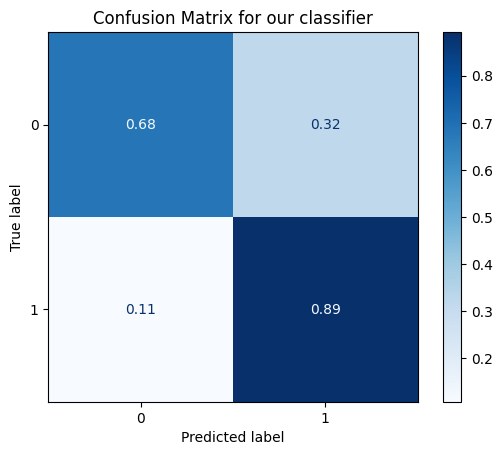

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay
matrix=ConfusionMatrixDisplay.from_estimator(svm_clf, X_test, Y_test,
                                             cmap=plt.cm.Blues, normalize='true')
plt.title('Confusion Matrix for our classifier')
plt.show(matrix)
plt.show()

In [ ]:
# Support Vectors

In [ ]:
support_vectors=svm_clf.support_vectors_

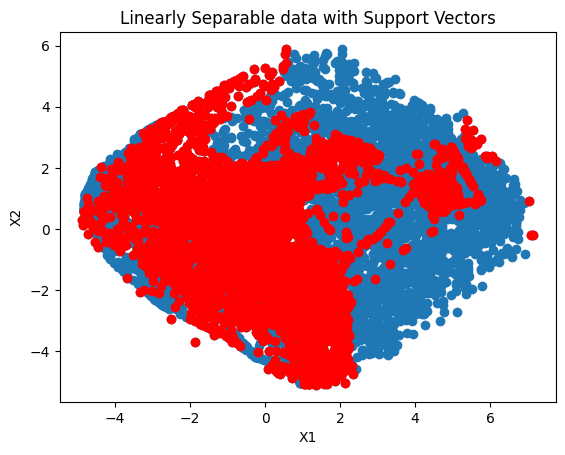

In [ ]:
plt.scatter(X_train[:,0], X_train[:,1])
plt.scatter(support_vectors[:,0],support_vectors[:,1],color='red')
plt.title('Linearly Separable data with Support Vectors')
plt.xlabel('X1')
plt.ylabel('X2')
plt.show()

In [ ]:
from sklearn.metrics import roc_curve, confusion_matrix
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
fpr, tpr, thresholds=roc_curve(Y_test, Y_val_scores[:,1])

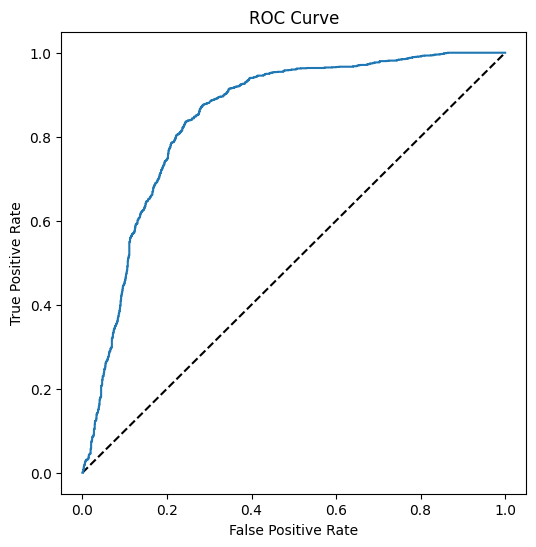

In [ ]:
fig=plt.figure(figsize=(6,6))
plt.plot([0,1],[0,1],'k--')
plt.plot(fpr,tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.show()

In [ ]:
from sklearn.inspection import PartialDependenceDisplay

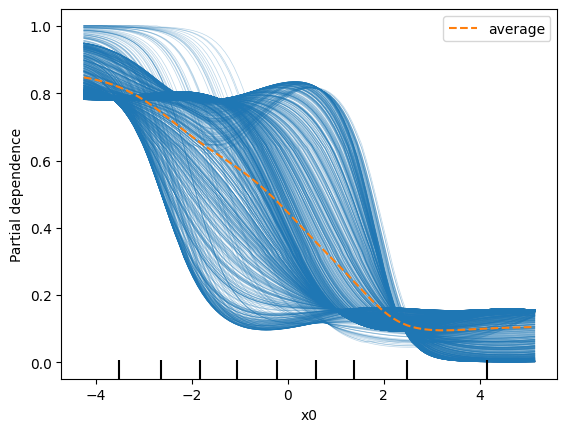

In [ ]:
features=[0]
PartialDependenceDisplay.from_estimator(svm_clf,X_train,features, kind='both')

# **Model Testing Naive Bayes**

In [ ]:
from sklearn.naive_bayes import GaussianNB



In [ ]:
gnb=GaussianNB()
gnb_model=gnb.fit(X_train, Y_train)
Y_pred_gnb=gnb_model.predict(X_test)

In [ ]:
from sklearn import metrics
print('Gaussian Naive Bayes model accuracy(in %):', metrics.accuracy_score(Y_test,Y_pred_gnb)*100)

Gaussian Naive Bayes model accuracy(in %): 74.96969696969697


In [ ]:
predictions_val=gnb_model.predict(X_test)
predictions_train=gnb_model.predict(X_train)
print('Validation Predicted Labels:', predictions_val)
print('Validation Actual Labels:', Y_test)

print('Training Predicted Labels:', predictions_train)
print('Training Actual Labels:', Y_train)

Validation Predicted Labels: [0 0 1 ... 1 1 1]
Validation Actual Labels: 0       0
1       0
2       0
3       0
4       0
       ..
3295    1
3296    1
3297    1
3298    1
3299    1
Name: Bankrupt?, Length: 3300, dtype: int64
Training Predicted Labels: [0 0 0 ... 0 1 0]
Training Actual Labels: 0       0
1       0
2       0
3       0
4       0
       ..
9893    1
9894    1
9895    1
9896    1
9897    1
Name: Bankrupt?, Length: 9898, dtype: int64


In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.metrics import precision_score, recall_score
from sklearn.metrics import roc_curve, roc_auc_score

In [ ]:
print('Accuracy for Validation Data:', accuracy_score(Y_test,predictions_val))
print('Accuracy for training Data:', accuracy_score(Y_train, predictions_train))

Accuracy for Validation Data: 0.7496969696969698
Accuracy for training Data: 0.7418670438472419


In [ ]:
predictions_train=gnb_model.predict(X_train)

In [ ]:
print(metrics.confusion_matrix(Y_train,predictions_train))
print(metrics.classification_report(Y_train,predictions_train))

[[3285 1664]
 [ 891 4058]]
              precision    recall  f1-score   support

           0       0.79      0.66      0.72      4949
           1       0.71      0.82      0.76      4949

    accuracy                           0.74      9898
   macro avg       0.75      0.74      0.74      9898
weighted avg       0.75      0.74      0.74      9898



In [ ]:
import seaborn as sns
from sklearn.metrics import confusion_matrix

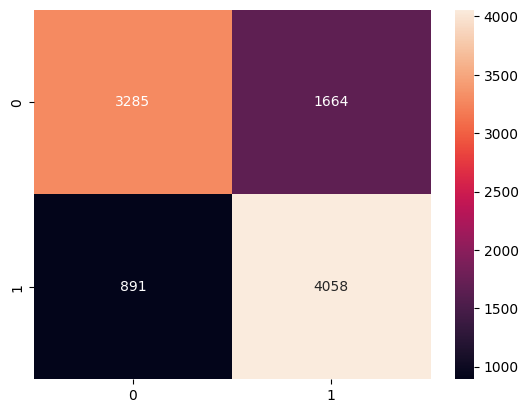

In [ ]:
cm=confusion_matrix(Y_train,predictions_train)
f=sns.heatmap(cm,annot=True, fmt='d')

In [ ]:
predictions_val=gnb_model.predict(X_test)

In [ ]:
print(metrics.confusion_matrix(Y_test, predictions_val))
print(metrics.classification_report(Y_test, predictions_val))

[[1070  580]
 [ 246 1404]]
              precision    recall  f1-score   support

           0       0.81      0.65      0.72      1650
           1       0.71      0.85      0.77      1650

    accuracy                           0.75      3300
   macro avg       0.76      0.75      0.75      3300
weighted avg       0.76      0.75      0.75      3300



In [ ]:
from sklearn.metrics import f1_score

In [ ]:
print('F1 Score over Validation Data', f1_score(Y_test,predictions_val))
print('F1 Score over Test Data', f1_score(Y_train,predictions_train))

F1 Score over Validation Data 0.7727022564667033
F1 Score over Test Data 0.760566020054353


In [ ]:
from sklearn.metrics import precision_score, recall_score

In [ ]:
print('Validation Data Metrics\n')
print('Overall Precision:', precision_score(Y_test,predictions_val))
print('Overall Recall:', recall_score(Y_test,predictions_val))
print('\nTrain Data Metrics\n')
print('overallPrecision:', precision_score(Y_train, predictions_train))
print('Overall Recall:', recall_score(Y_train, predictions_train))

Validation Data Metrics

Overall Precision: 0.7076612903225806
Overall Recall: 0.850909090909091

Train Data Metrics

overallPrecision: 0.7091925900034953
Overall Recall: 0.8199636290159629


In [ ]:
Y_val_scores=gnb_model.predict_proba(X_test)
print(Y_val_scores)

Y_train_scores=gnb_model.predict_proba(X_train)
print(Y_train_scores)

[[0.93527678 0.06472322]
 [0.9836175  0.0163825 ]
 [0.4877334  0.5122666 ]
 ...
 [0.18176476 0.81823524]
 [0.26348274 0.73651726]
 [0.2325821  0.7674179 ]]
[[0.75766707 0.24233293]
 [0.9776532  0.0223468 ]
 [0.64465233 0.35534767]
 ...
 [0.8891945  0.1108055 ]
 [0.26808952 0.73191048]
 [0.80819298 0.19180702]]


In [ ]:
# Confusion Matrix
from sklearn.metrics import ConfusionMatrixDisplay

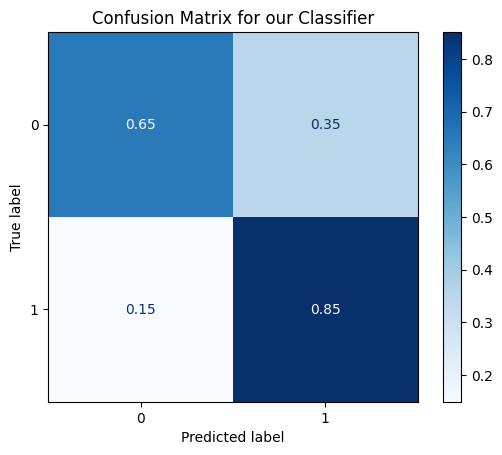

In [ ]:
matrix=ConfusionMatrixDisplay.from_estimator(gnb_model, X_test, Y_test,
                                             cmap=plt.cm.Blues, normalize='true')
plt.title('Confusion Matrix for our Classifier')
plt.show(matrix)
plt.show()

In [ ]:
from sklearn.metrics import roc_curve
from sklearn.metrics import confusion_matrix
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
fpr, tpr, thresholds = roc_curve(Y_test, Y_val_scores[:,1])

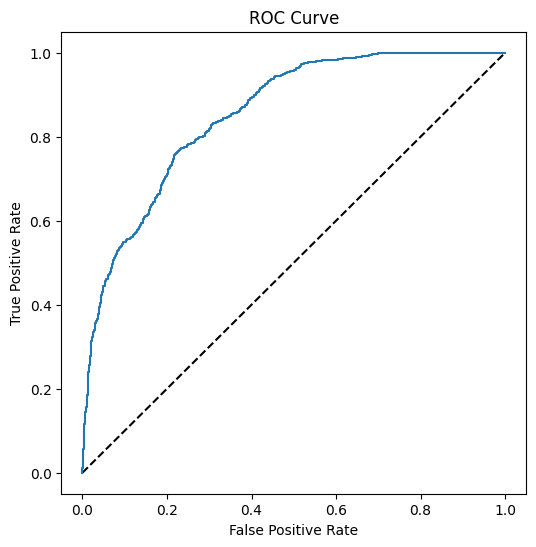

In [ ]:
fig=plt.figure(figsize=(6,6))
plt.plot([0,1],[0,1],'k--')
plt.plot(fpr,tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.show()

In [ ]:
from sklearn.metrics import roc_auc_score

In [ ]:
auc=roc_auc_score(Y_test,Y_val_scores[:,1])
print('AUC:', str(auc))

AUC: 0.8539599632690542


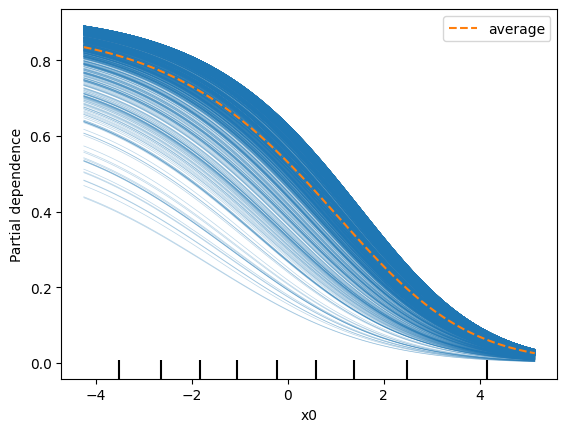

In [ ]:
from sklearn.inspection import PartialDependenceDisplay
features=[0]
PartialDependenceDisplay.from_estimator(gnb_model, X_train, features, kind='both')

# **Model Testing KNN**

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split

In [ ]:
knn_clf=KNeighborsClassifier(n_neighbors=3)

In [ ]:
knn_clf=knn_clf.fit(X_train, Y_train)

In [ ]:
predictions=knn_clf.predict(X_test)
predictions

array([0, 1, 0, ..., 1, 0, 1])

In [ ]:
predictions_val=knn_clf.predict(X_test)
predictions_train=knn_clf.predict(X_train)
print('Validation Predicted Labels:', predictions_val)
print('Validation Actual Labels:', Y_test)

print('Training Predicted Labels:', predictions_train)
print('Training Actual Labels:', Y_train)

Validation Predicted Labels: [0 1 0 ... 1 0 1]
Validation Actual Labels: 0       0
1       0
2       0
3       0
4       0
       ..
3295    1
3296    1
3297    1
3298    1
3299    1
Name: Bankrupt?, Length: 3300, dtype: int64
Training Predicted Labels: [1 0 0 ... 0 1 0]
Training Actual Labels: 0       0
1       0
2       0
3       0
4       0
       ..
9893    1
9894    1
9895    1
9896    1
9897    1
Name: Bankrupt?, Length: 9898, dtype: int64


In [ ]:
print('Accuracy for training data:', knn_clf.score(X_train, Y_train))
print('Accuracy for validation data:', knn_clf.score(X_test, Y_test))

Accuracy for training data: 0.8801778136997374
Accuracy for validation data: 0.6987878787878787


In [ ]:
from sklearn.metrics import classification_report

In [ ]:
print('Validation Data Classification Report \n', classification_report(Y_test, predictions_val))
print('Train Data Classification Report \n', classification_report(Y_train, predictions_train))

Validation Data Classification Report 
               precision    recall  f1-score   support

           0       0.68      0.74      0.71      1650
           1       0.71      0.66      0.69      1650

    accuracy                           0.70      3300
   macro avg       0.70      0.70      0.70      3300
weighted avg       0.70      0.70      0.70      3300

Train Data Classification Report 
               precision    recall  f1-score   support

           0       0.91      0.84      0.88      4949
           1       0.85      0.92      0.88      4949

    accuracy                           0.88      9898
   macro avg       0.88      0.88      0.88      9898
weighted avg       0.88      0.88      0.88      9898



In [ ]:
from sklearn.metrics import f1_score

In [ ]:
print('F1 Score over Validation Data', f1_score(Y_test, predictions_val))
print('F1 Score over Test Data', f1_score(Y_train, predictions_train))

F1 Score over Validation Data 0.6870277078085643
F1 Score over Test Data 0.8847200622083983


In [ ]:
from sklearn.metrics import precision_score, recall_score

In [ ]:
print('Validation Data Metrics\n')
print('Overall Precision:', precision_score(Y_test, predictions_val))
print('Overall Recall:', recall_score(Y_test, predictions_val))
print('\nTrain Data Metrics\n')
print('Overall Precision:', precision_score(Y_train, predictions_train))
print('Overall Recall:',recall_score(Y_train, predictions_train))

Validation Data Metrics

Overall Precision: 0.7149410222804718
Overall Recall: 0.6612121212121213

Train Data Metrics

Overall Precision: 0.8524068177561341
Overall Recall: 0.9195797130733482


In [ ]:
from sklearn.metrics import confusion_matrix

In [ ]:
print('\nValidation Data Confusion Matrix')
val_cm=confusion_matrix(Y_test, predictions_val)
print(val_cm)

print('\nTrain Data Confusion Matrix')
train_cm=confusion_matrix(Y_train, predictions_train)
print(train_cm)


Validation Data Confusion Matrix
[[1215  435]
 [ 559 1091]]

Train Data Confusion Matrix
[[4161  788]
 [ 398 4551]]


In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay

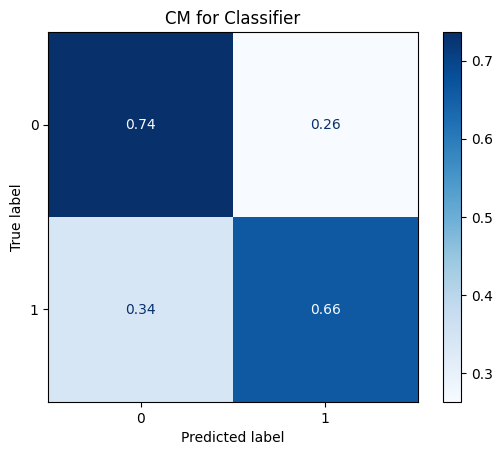

In [ ]:
matrix=ConfusionMatrixDisplay.from_estimator(knn_clf, X_test,Y_test,cmap=plt.cm.Blues,normalize='true')
plt.title('CM for Classifier')
plt.show(matrix)
plt.show()

In [ ]:
from sklearn.metrics import roc_curve
from sklearn.metrics import confusion_matrix
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
fpr,tpr,thresholds=roc_curve(Y_test, Y_val_scores[:,1])

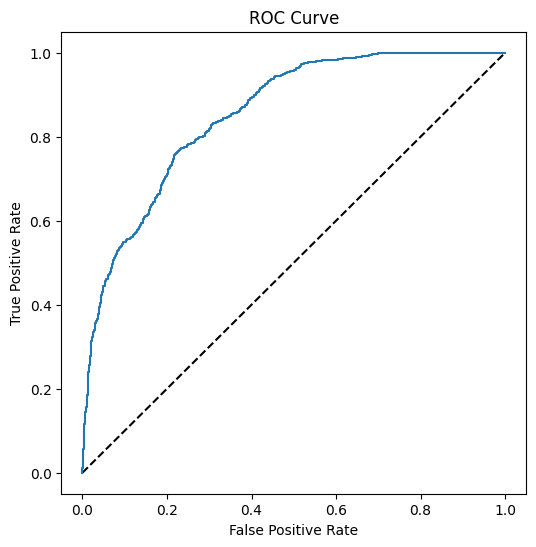

In [ ]:
#ROC Curve
fig=plt.figure(figsize=(6,6))
plt.plot([0,1],[0,1],'k--')
plt.plot(fpr,tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.show()

# **Model Testing Random Forest**

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from numpy import mean, std


In [ ]:
rf_clf=RandomForestClassifier(random_state=8)

In [ ]:
rf_clf_cv_score=cross_val_score(rf_clf,X_train,Y_train)

In [ ]:
print('Cross Validation Scores are{}'.format(rf_clf_cv_score))

Cross Validation Scores are[0.8020202  0.79141414 0.78888889 0.78575038 0.79383527]


In [ ]:
print('Avg Cross Val. Score on Train Data :{}'.format(rf_clf_cv_score.mean()))

Avg Cross Val. Score on Train Data :0.7923817763282138


In [ ]:
print('Accuracy Score on Train Data: %.3f +/- (%.3f)' % (mean(rf_clf_cv_score),std(rf_clf_cv_score)))

Accuracy Score on Train Data: 0.792 +/- (0.006)


In [ ]:
from sklearn.model_selection import cross_val_predict
predtrain_rf_cv_clf=cross_val_predict(rf_clf,X_train, Y_train)
predtrain_rf_cv_clf

array([1, 0, 0, ..., 0, 0, 0])

In [ ]:
from sklearn.metrics import mean_squared_error,r2_score

In [ ]:
print('RMSE for Train Data', mean_squared_error(Y_train,predtrain_rf_cv_clf,squared='False'))

RMSE for Train Data 0.20761770054556475


In [ ]:
predval_rf_cv_clf=cross_val_predict(rf_clf,X_test,Y_test)

In [ ]:
print('RMSE for Valdation Data', mean_squared_error(Y_test,predval_rf_cv_clf,squared='False'))

RMSE for Valdation Data 0.15


# **Model Testing Decision Trees**

In [ ]:
from sklearn.model_selection import GridSearchCV, LeaveOneOut
from sklearn.tree import DecisionTreeClassifier
from numpy import mean, std

In [ ]:
dt_clf=DecisionTreeClassifier(random_state=8)
dt_clf_cv_score=cross_val_score(dt_clf, X_train, Y_train)

In [ ]:
print('Cross Validation Scores Over Train Data are {}'.format(dt_clf_cv_score))

Cross Validation Scores Over Train Data are [0.75959596 0.73636364 0.74090909 0.73370389 0.75341081]


In [ ]:
print('Avg Cross Val. Score on Train Data: {}'.format(dt_clf_cv_score.mean()))

Avg Cross Val. Score on Train Data: 0.7447966782529694


In [ ]:
print('Accuracy score on Train Data : %.3f +/- (%.3f)' % (mean(dt_clf_cv_score),std(dt_clf_cv_score)))

Accuracy score on Train Data : 0.745 +/- (0.010)


In [ ]:
dt_predtrain_cv_clf=cross_val_predict(dt_clf,X_train, Y_train)
print('Prediction on Train Data', dt_predtrain_cv_clf)

Prediction on Train Data [0 0 0 ... 0 0 0]


In [ ]:
from sklearn.metrics import mean_squared_error, r2_score
dt_predval_cv_clf=cross_val_predict(dt_clf,X_test,Y_test)
print('RMSE for Train Data', mean_squared_error(Y_test,dt_predval_cv_clf,squared='False' ))

RMSE for Train Data 0.18636363636363637


In [ ]:
dt_param={'criterion':['gini','entropy'],'max_features':['sqrt','log2'],'max_depth':[5,6,7,8]}
dt_clf_tune=GridSearchCV(estimator=dt_clf, param_grid=dt_param, scoring='f1', n_jobs=-1)
dt_clf_tune_model=dt_clf_tune.fit(X_train, Y_train)

In [ ]:
print('Best Parameters:',dt_clf_tune.best_params_)
print("Best Model's Score", dt_clf_tune.best_score_)

Best Parameters: {'criterion': 'gini', 'max_depth': 7, 'max_features': 'sqrt'}
Best Model's Score 0.7906040238611973


In [ ]:
dt_clf_tune_cv_trainscore=cross_val_score(dt_clf_tune.best_estimator_, X_train, Y_train)

In [ ]:
print("Cross Validation Scores Over Train Data are {}".format(dt_clf_tune_cv_trainscore))

Cross Validation Scores Over Train Data are [0.77828283 0.76767677 0.78888889 0.77766549 0.7786761 ]


In [ ]:
print("Avarage Cross Validation Score on Test Data : {}".format(dt_clf_tune_cv_trainscore.mean()))

Avarage Cross Validation Score on Test Data : 0.7782380143016827


In [ ]:
print('Accuracy Score on Train Data: %3f +/- (%.3f)' % (mean(dt_clf_tune_cv_trainscore),std(dt_clf_tune_cv_trainscore)))

Accuracy Score on Train Data: 0.778238 +/- (0.007)


In [ ]:
predtrain_dt_clf_tune=dt_clf_tune.best_estimator_.predict(X_train)
print('RMSE for Train Data with Best Model', mean_squared_error(Y_train, predtrain_dt_clf_tune, squared='False'))

RMSE for Train Data with Best Model 0.19862598504748433


In [ ]:
dt_clf_tune_cv_valscore=cross_val_score(dt_clf_tune.best_estimator_, X_test, Y_test)

In [ ]:
print("Cross Val Scores over Test Data are {}".format(dt_clf_tune_cv_valscore))

Cross Val Scores over Test Data are [0.80454545 0.83484848 0.81515152 0.82121212 0.78181818]


In [ ]:
print("Avg Cross Val Score on Test Data : {}".format(dt_clf_tune_cv_valscore.mean()))

Avg Cross Val Score on Test Data : 0.8115151515151515


In [ ]:
print('Accuracy Score on Test Data: %3f +/- (%.3f)' % (mean(dt_clf_tune_cv_valscore), std(dt_clf_tune_cv_valscore)))

Accuracy Score on Test Data: 0.811515 +/- (0.018)


In [ ]:
predval_dt_clf_tune=dt_clf_tune.best_estimator_.predict(X_test)

In [ ]:
print('Predition on Validation Data', predval_dt_clf_tune)

Predition on Validation Data [0 1 0 ... 1 0 1]


In [ ]:
print('RMSE for Validation Data with Best model', mean_squared_error(Y_test,predval_dt_clf_tune,squared='False'))

RMSE for Validation Data with Best model 0.24303030303030304


In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score

In [ ]:
print('Validation Data Metrics\n')
print("Overall Precision:", precision_score(Y_test, predval_dt_clf_tune))
print("Overall Recall:", recall_score(Y_test, predval_dt_clf_tune))
print('\nTrain Data Metrics\n')
print("Overall Precision:", precision_score(Y_train, predtrain_dt_clf_tune))
print("Overall Recall:", recall_score(Y_train, predtrain_dt_clf_tune))

Validation Data Metrics

Overall Precision: 0.7279569892473118
Overall Recall: 0.8206060606060606

Train Data Metrics

Overall Precision: 0.7633763023132615
Overall Recall: 0.8735097999595878


In [ ]:
print('F1 Score over Validation Data',f1_score(Y_test,predval_dt_clf_tune))
print('F1 Score over Test Data', f1_score(Y_train, predtrain_dt_clf_tune))

F1 Score over Validation Data 0.7715099715099716
F1 Score over Test Data 0.8147380324161326


# **Model Building Using Random Forest**

Random Forest is a supervised machine learning algorithm which is based on ensemble learning. In this project, I built Random Forest Classifier models to predict the bankruptcies of certain companies listed on Taiwan Stock Exchange using data collected from the Taiwan Economic Journal for the years 1999 to 2009.

Random Forest algorithm combines multiple decision-trees, resulting in a forest of trees, hence the name ' Random Forest'.It creates decision trees on the given data samples, gets prediction from each tree. The higher the number of trees in the forest results in higher accuracy.

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
rfc=RandomForestClassifier(random_state=0)

In [ ]:
#fit the model
rfc.fit(X_train, Y_train)

RandomForestClassifier(random_state=0)

In [ ]:
Y_pred=rfc.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score

In [ ]:
print('Model Accuracy Score With 10 Decision-Trees : {0:0.4f}'.format(accuracy_score(Y_test,Y_pred)))

Model Accuracy Score With 10 Decision-Trees : 0.7221


In [ ]:
rfc_100=RandomForestClassifier(n_estimators=100,random_state=0)

In [ ]:
rfc_100.fit(X_train, Y_train)

RandomForestClassifier(random_state=0)

In [ ]:
Y_pred_100=rfc_100.predict(X_test)

In [ ]:
# Checking accuracy score
print('Model Accuracy Score with 100 Decision-Trees : {0:0.4f}'.format(accuracy_score(Y_test,Y_pred_100)))

Model Accuracy Score with 100 Decision-Trees : 0.7221


In [ ]:
# Feature Scores
model=RandomForestClassifier().fit(X_train, Y_train)

In [ ]:
feature_scores=model.feature_importances_

In [ ]:
import pandas as pd

In [ ]:
X_train_df=pd.DataFrame(X_train)

In [ ]:
for feature, score in zip(X_train_df.columns,feature_scores):
  print(f"{feature}:{score}")

0:0.6131268348175893
1:0.38687316518241077


In [ ]:
# Print the faeture scores
for feature, score in zip(X_train_df.columns, feature_scores):
  print(f"{feature}:{score}")

0:0.6131268348175893
1:0.38687316518241077


In [ ]:
predictions=model.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score

In [ ]:
accuracy=accuracy_score(Y_test, predictions)
print("Accuracy:",accuracy)

Accuracy: 0.7227272727272728


In [ ]:
from sklearn.metrics import confusion_matrix

In [ ]:
matrix=confusion_matrix(Y_test,predictions)
print(matrix)

[[1247  403]
 [ 512 1138]]


In [ ]:
# Tuning Model Parameters
model=RandomForestClassifier(n_estimators=100)
model.fit(X_train, Y_train)
predictions=model.predict(X_test)
accuracy=accuracy_score(Y_test,predictions)
print("Accuracy:", accuracy)

Accuracy: 0.7187878787878788


In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score

In [ ]:
precision=precision_score(Y_test, predictions)
recall=recall_score(Y_test,predictions)
f1=f1_score(Y_test,predictions)

In [ ]:
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

Precision: 0.7371879106438897
Recall: 0.68
F1 Score: 0.7074401008827238


# **Model Testing Version 2**

In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Bankrupt?,"6,819.000000",0.032263,0.176710,0.000000,0.000000,0.000000,0.000000,1.000000
ROA(C) before interest and depreciation before interest,"6,819.000000",0.505739,0.028841,0.469702,0.476527,0.502706,0.535563,0.546044
ROA(A) before interest and % after tax,"6,819.000000",0.561462,0.026865,0.526308,0.535543,0.559802,0.589157,0.598310
ROA(B) before interest and depreciation after tax,"6,819.000000",0.555207,0.027665,0.520370,0.527277,0.552278,0.584105,0.593715
Operating Gross Margin,"6,819.000000",0.607007,0.006489,0.599209,0.600445,0.605997,0.613914,0.616189
...,...,...,...,...,...,...,...,...
Net Income to Stockholder's Equity,"6,819.000000",0.841183,0.001121,0.839659,0.840115,0.841179,0.842357,0.842652
Liability to Equity,"6,819.000000",0.279182,0.002208,0.276589,0.276944,0.278778,0.281449,0.282365
Degree of Financial Leverage (DFL),"6,819.000000",0.026848,0.000071,0.026787,0.026791,0.026808,0.026913,0.026968
Interest Coverage Ratio (Interest expense to EBIT),"6,819.000000",0.565428,0.000320,0.565158,0.565158,0.565252,0.565725,0.565959


In [ ]:
df['Bankrupt?'].value_counts()

Bankrupt?
0    6599
1     220
Name: count, dtype: int64

Data is highly imbalanced. So, We Will Use SMOTE to balance Data.

**Multicollinearity-Check**

In [ ]:
# if the correlation is >0.95 or <-0.95, remove the columns to avoid multicollinearity in the data-set.
corr_mat=df.corr()

In [ ]:
corr_mat=corr_mat.iloc[1:,1:]

In [ ]:
drop_list=[]
for i in range(len(corr_mat.columns)):
  for j in range(i):
   if(corr_mat.iloc[i,j]>=0.95 or corr_mat.iloc[i,j]<=-0.95):
      if corr_mat.columns[j] not in drop_list:
        drop_list.append(corr_mat.columns[j])

In [ ]:
len(drop_list)

26

In [ ]:
df=df.drop(drop_list,axis=1)

In [ ]:
len(df.columns)

68

In [ ]:
Y1=df['Bankrupt?']
X1=df.drop(['Bankrupt?'],axis=1)

**Balancing Data**

In [ ]:
from imblearn.over_sampling import SMOTE

In [ ]:
smote=SMOTE(sampling_strategy='minority')
X1_sm, Y1_sm = smote.fit_resample(X1,Y1)
Y1_sm.value_counts()

Bankrupt?
1    6599
0    6599
Name: count, dtype: int64

In [ ]:
X1_train,X1_test,Y1_train,Y1_test=train_test_split(X1_sm,Y1_sm,test_size=0.2,random_state=101,stratify=Y1_sm)

In [ ]:
scaler=StandardScaler()
X1_train=scaler.fit_transform(X1_train)
X1_test=scaler.transform(X1_test)

**Hyper Parameter Tuning**

In [ ]:
from sklearn.model_selection import GridSearchCV

In [ ]:
model_params={
    'svm': {
        'model':SVC(gamma='auto',probability=True),
        'params':{
            'C':[1,10,20],
            'kernel':['rbf','linear','sigmond']
        }
    },
    'random_forest':{
        'model':RandomForestClassifier(),
        'params':{
            'n_estimators':[1,5,10,20,30,50],
            'criterion':['gini','entropy']
        }
    },
    'logistic_regression':{
        'model':LogisticRegression(multi_class='auto'),
        'params': {
            'C':[1,5,10],
            'solver':['ibfgs','liblinear']
        }
    },
    'KNN':{
        'model':KNeighborsClassifier(),
        'params':{
            'n_neighbors':[1,3,5,7],
            'algorithm':['auto','kd_tree']
        }
    }
}

**Data Normalization**

In [ ]:
scaler=StandardScaler()
X1_scaled=scaler.fit_transform(X1_sm)

In [ ]:
#implementing Grid Search CV for SVM, RF, LR and KNN
scores=[]

for model_name,mp in model_params.items():
  clf=GridSearchCV(mp['model'],cv=3,verbose=3,n_jobs=-1,scoring='recall',return_train_score=False,param_grid=mp['params'])
  clf.fit(X1_scaled,Y1_sm)
  scores.append({
      'model':model_name,
      'best_score':clf.best_score_,
      'best_params':clf.best_params_
  })
  df1=pd.DataFrame(scores,columns=['model','best_score','best_params'])
  df1

Fitting 3 folds for each of 9 candidates, totalling 27 fits
Fitting 3 folds for each of 12 candidates, totalling 36 fits
Fitting 3 folds for each of 6 candidates, totalling 18 fits
Fitting 3 folds for each of 8 candidates, totalling 24 fits


In [ ]:
df1=pd.DataFrame(scores,columns=['model','best_score','best_params'])
df1

,model,best_score,best_params
0,svm,1.000000,"{'C': 1, 'kernel': 'rbf'}"
1,random_forest,0.991364,"{'criterion': 'entropy', 'n_estimators': 50}"
2,logistic_regression,0.939688,"{'C': 1, 'solver': 'liblinear'}"
3,KNN,1.000000,"{'algorithm': 'auto', 'n_neighbors': 1}"


The table provides us with the tuned parameters of differnt models.

# **SVM, RF, LR, KNN**

**1.SVM**

In [ ]:
model_svm=SVC(gamma='auto',C=20,kernel='rbf',probability=True)
model_svm.fit(X1_train,Y1_train)
svm_predictions=model_svm.predict(X1_test)

In [ ]:
pd.DataFrame(confusion_matrix(Y1_test,svm_predictions))

,0,1
0,1296,24
1,0,1320


In [ ]:
print(classification_report(Y1_test,svm_predictions))

              precision    recall  f1-score   support

           0       1.00      0.98      0.99      1320
           1       0.98      1.00      0.99      1320

    accuracy                           0.99      2640
   macro avg       0.99      0.99      0.99      2640
weighted avg       0.99      0.99      0.99      2640



**SVM has accuracy rate of 99%**

**2.Random Forest**

In [ ]:
rfc=RandomForestClassifier(n_estimators=50, criterion='entropy')
rfc.fit(X1_train, Y1_train)
rfc_pred=rfc.predict(X1_test)

In [ ]:
from sklearn.metrics import confusion_matrix

In [ ]:
pd.DataFrame(confusion_matrix(Y1_test,rfc_pred))

,0,1
0,1288,32
1,10,1310


In [ ]:
print(classification_report(Y1_test,rfc_pred))

              precision    recall  f1-score   support

           0       0.99      0.98      0.98      1320
           1       0.98      0.99      0.98      1320

    accuracy                           0.98      2640
   macro avg       0.98      0.98      0.98      2640
weighted avg       0.98      0.98      0.98      2640



**RF has accuracy of 98%.**

**3.Logistic Regression**

In [ ]:
logmodel=LogisticRegression(solver='liblinear',multi_class='auto',C=5)
logmodel.fit(X1_train,Y1_train)
log_predictions=logmodel.predict(X1_test)

In [ ]:
pd.DataFrame(confusion_matrix(Y1_test, log_predictions))

,0,1
0,1156,164
1,75,1245


In [ ]:
print(classification_report(Y1_test,log_predictions))

              precision    recall  f1-score   support

           0       0.94      0.88      0.91      1320
           1       0.88      0.94      0.91      1320

    accuracy                           0.91      2640
   macro avg       0.91      0.91      0.91      2640
weighted avg       0.91      0.91      0.91      2640



**LR has accuracy of 91%**

**4.KNN**

In [ ]:
knn=KNeighborsClassifier(n_neighbors=3, algorithm='auto')
knn.fit(X1_train, Y1_train)
knn_pred=knn.predict(X1_test)

In [ ]:
pd.DataFrame(confusion_matrix(Y1_test,knn_pred))

,0,1
0,1166,154
1,0,1320


In [ ]:
print(classification_report(Y1_test,knn_pred))

              precision    recall  f1-score   support

           0       1.00      0.88      0.94      1320
           1       0.90      1.00      0.94      1320

    accuracy                           0.94      2640
   macro avg       0.95      0.94      0.94      2640
weighted avg       0.95      0.94      0.94      2640



**KNN has accuracy of 94%**

**5. ROC & AUC**

In [ ]:
from sklearn.metrics import roc_curve, auc

In [ ]:
#ROC LR
Y1_pred_logistic=logmodel.predict_proba(X1_test)[:,1]
logistic_fpr,logistic_tpr,threshold = roc_curve(Y1_test,Y1_pred_logistic)
auc_logistic=auc(logistic_fpr,logistic_tpr)

In [ ]:
#ROC RF
Y1_pred_rfc=rfc.predict_proba(X1_test)[:,1]
rfc_fpr,rfc_tpr,threshold=roc_curve(Y1_test,Y1_pred_rfc)
auc_rfc=auc(rfc_fpr,rfc_tpr)

In [ ]:
#ROC SVM
Y1_pred_svm=model_svm.predict_proba(X1_test)[:,1]
svm_fpr,svm_tpr,threshold=roc_curve(Y1_test, Y1_pred_svm)
auc_svm=auc(svm_fpr,svm_tpr)

In [ ]:
#ROC KNN
Y1_pred_knn=knn.predict_proba(X1_test)[:,1]
knn_fpr,knn_tpr,threshold=roc_curve(Y1_test,Y1_pred_knn)
auc_knn=auc(knn_fpr,knn_tpr)

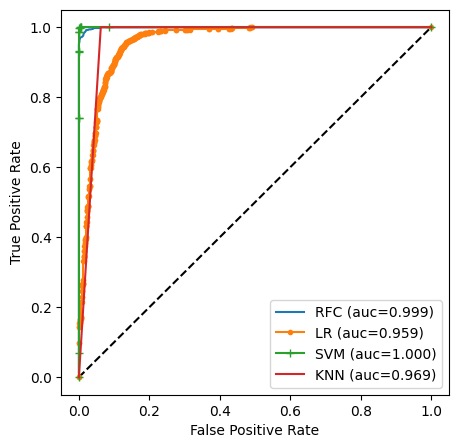

In [ ]:
#ROC Plot
plt.figure(figsize=(5,5),dpi=100)
plt.plot([0,1],[0,1],'k--')
plt.plot(rfc_fpr,rfc_tpr,linestyle='-',label='RFC (auc=%0.3f)' % auc_rfc)
plt.plot(logistic_fpr,logistic_tpr,marker='.',label='LR (auc=%0.3f)' % auc_logistic)
plt.plot(svm_fpr,svm_tpr,marker='+',label='SVM (auc=%0.3f)' % auc_svm)
plt.plot(knn_fpr,knn_tpr, linestyle='-',label='KNN (auc=%0.3f)' %auc_knn)

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='best')

Performaces of RF and SVM are better than the rest.

# **Model Building - RF**

**Train the RF model**

In [ ]:
rfc=RandomForestClassifier(n_estimators=100,random_state=42)
rfc.fit(X1_train, Y1_train)

RandomForestClassifier(random_state=42)

**Evaluate the Model**

In [ ]:
Y1_pred=rfc.predict(X1_test)
accuracy=accuracy_score(Y1_test,Y1_pred)
print(f'Accuracy: {accuracy:.2f}')

Accuracy: 0.99


**Improve the Model**

In [ ]:
from sklearn.model_selection import GridSearchCV

In [ ]:
# Define the Grid of hyperparameters to search
param_grid= {
    'n_estimators': [100,200,300],
    'max_depth':[None,5,10],
    'min_samples_split':[2,5,10],
    'min_samples_leaf':[1,2,4]
}

In [ ]:
rfc=RandomForestClassifier(random_state=42)
grid_search=GridSearchCV(rfc,param_grid,cv=5)
grid_search.fit(X1_train, Y1_train)
best_model=grid_search.best_estimator_
y_pred=best_model.predict(X1_test)
accuracy=accuracy_score(Y1_test,Y1_pred)
print(f'Accuracy: {accuracy:.2f}')

Accuracy: 0.99


This code was used to define a grid of various hyperparameters and by using GridSearchCV to find the best combination that maximizes the model's accuracy on the training data using 5-fold cross-validation.

# **Model Building - SVM**

**Model Training**

In [ ]:
from sklearn.svm import SVC

In [ ]:
model = SVC()

In [ ]:
model.kernel='linear'
model.C=1.0

In [ ]:
model.fit(X1_train, Y1_train)

SVC(kernel='linear')

**Model Evalution**

In [ ]:
Y1_pred=model.predict(X1_test)
accuracy=accuracy_score(Y1_test, Y1_pred)
precision=precision_score(Y1_test,Y1_pred)
recall=recall_score(Y1_test,Y1_pred)
f1=f1_score(Y1_test,Y1_pred)

In [ ]:
print('Accuracy:',accuracy)
print('Precision:',precision)
print('Recall:',recall)
print('F1 Score:',f1)

Accuracy: 0.9113636363636364
Precision: 0.8760387811634349
Recall: 0.9583333333333334
F1 Score: 0.9153400868306802


**Model Improvement**

In [ ]:
model.kernel='rbf'
model.C=10.0
model.fit(X1_train, Y1_train)

SVC(C=10.0)

In [ ]:
Y1_pred=model.predict(X1_test)
accuracy=accuracy_score(Y1_test,Y1_pred)
print('Accuracy',accuracy)

Accuracy 0.9916666666666667


# **Model Deployment 1 (Failed)**

In [ ]:
import pickle

In [ ]:
with open('model.pkl','wb') as file:
  pickle.dump(model, file)

In [ ]:
def predict_bankruptcy(data):
  with open('model.pkl','rb') as file:
    model=pickle.load(file)

  prediction=model.predict(data)

  return prediction

In [ ]:
from flask import Flask, request, jsonify
import pickle

In [ ]:
app=Flask(__name__)


In [ ]:
model=pickle.load(open('model.pkl','rb'))

In [ ]:
@app.route('/predict', methods=['POST'])
def predict():
  data=request.get_json()

  prediction=model.predict([data])

  return jsonify({'prediction':str(prediction[0])})

if __name__ == '__main__':
  app.run(debug=True)

 * Serving Flask app '__main__'
 * Debug mode: on


INFO:werkzeug:WARNING: This is a development server. Do not use it in a production deployment. Use a production WSGI server instead.
 * Running on http://127.0.0.1:5000
INFO:werkzeug:Press CTRL+C to quit
INFO:werkzeug: * Restarting with stat


app.run running for hours, which means that there is an infinite loop. So, trying troubleshooting.

**Checking Logs**

In [ ]:
import logging

app.logger.setLevel(logging.DEBUG)

app.run()

 * Serving Flask app '__main__'
 * Debug mode: on


INFO:werkzeug:WARNING: This is a development server. Do not use it in a production deployment. Use a production WSGI server instead.
 * Running on http://127.0.0.1:5000
INFO:werkzeug:Press CTRL+C to quit
INFO:werkzeug: * Restarting with stat


Even checking the logs is taking a long time, which means the application is generating a lot of logs.

**Reducing the log level**

In [ ]:
import logging

app.logger.setLevel(logging.ERROR)

**Filtering the logs**

In [ ]:
import logging

handler = logging.StreamHandler()
formatter = logging.Formatter('%(asctime)s %(levelname)s: %(message)s')
handler.setFormatter(formatter)

app.logger.addHandler(handler)

app.logger.setLevel(logging.INFO)

app.logger.info('logged')
app.logger.debug('not logged')

2024-04-11 07:17:39,602 INFO: logged
INFO:__main__:logged


**Logging additional Information**

In [ ]:
import logging

def my_function():
  logging.debug('Value of variable x: {}'.format(x))

app.run()

 * Serving Flask app '__main__'
 * Debug mode: on


INFO:werkzeug:WARNING: This is a development server. Do not use it in a production deployment. Use a production WSGI server instead.
 * Running on http://127.0.0.1:5000
INFO:werkzeug:Press CTRL+C to quit
INFO:werkzeug: * Restarting with stat


# **Model Deployment 2 (FastAPI and Ngrok)**

**Saving the Model**

In [ ]:
import pickle

In [ ]:
from sklearn.svm import SVC

In [ ]:
model=SVC(kernel='linear',C=1.0)
model.fit(X1_train, Y1_train)

SVC(kernel='linear')

In [ ]:
classifier=model

In [ ]:
filename='pramod_model.sav'
pickle.dump(classifier, open(filename,'wb'))

**Importing Libraries**

In [ ]:
!pip install fastapi
!pip install uvicorn
!pip install pickle5
!pip install pydantic
!pip install scikit-learn
!pip install requests
!pip install pypi-json
!pip install pyngrok
!pip install nest-asyncio

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 91.9/91.9 kB 3.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.9/71.9 kB 8.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.8/60.8 kB 2.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 5.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 132.1/132.1 kB 3.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pickle5: filename=pickle5-0.0.11-cp310-cp310-linux_x86_64.whl size=255316 sha256=03e02f88be87436297eb8c8f67c3c4a74e2ed0a53aabb28851a1a4b312a4478a
  Stored in directory: /root/.cache/pip/wheels/7d/14/ef/4aab19d27fa8e58772be5c71c16add0426acf9e1f64353235c
Successfully built pickle5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.0/108.0 kB 3.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.3/99.3 kB 6.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.2/127.2 kB 9.6 MB/s eta 0:00:00


In [ ]:
from fastapi import FastAPI
from pydantic import BaseModel
import pickle
import json
import uvicorn
from pyngrok import ngrok
from fastapi.middleware.cors import CORSMiddleware
import nest_asyncio

**Creating FastAPI Application**

In [ ]:
app=FastAPI()

In [ ]:
origins=["*"]

app.add_middleware(
    CORSMiddleware,
    allow_origins=origins,
    allow_credentials=True,
    allow_methods=["*"],
    allow_headers=["*"],
)

In [ ]:
df.dtypes

Bankrupt?                                                int64
 ROA(B) before interest and depreciation after tax     float64
 Operating Profit Rate                                 float64
 Non-industry income and expenditure/revenue           float64
 Continuous interest rate (after tax)                  float64
                                                        ...   
 Gross Profit to Sales                                 float64
 Net Income to Stockholder's Equity                    float64
 Liability to Equity                                   float64
 Interest Coverage Ratio (Interest expense to EBIT)    float64
 Equity to Liability                                   float64
Length: 68, dtype: object

In [ ]:
pramod_model=pickle.load(open('pramod_model.sav','rb'))

In [ ]:
!pip install pydantic

In [ ]:
class model_input(BaseModel):
  Operating_Profit_Rate: float
  Continuous_interest_rate_after_tax: float
  Gross_Profit_to_Sales: float
  Liability_to_Equity: float
  Equity_to_Liability: float

In [ ]:
@app.post('/bankruptcy_prediction')
def bankruptcy_pred(input_parameters:model_input):

  input_data=input_parameters.json()
  input_dictionary=json.loads(input_data)

  OPR=input_dictionary['Operating Profit Rate']
  CIR=input_dictionary['Continuous interest rate (after tax)']
  GPS=input_dictionary['Gross Profit to Sales']
  LTE=input_dictionary['Liability to Equity']
  ETL=input_dictionary['Equity to Liability']

  input_list=[OPR, CIR, GPS, LTE, ETL]

  prediction=pramod_model.predict([input_list])

  if (prediction[0]==0):
    return 'Not going to Bankrupt'
  else:
    return 'Going to Bankrupt'


**Installing ngrok**

In [ ]:
!pip install nest-asyncio

In [ ]:
!pip install pyngrok

In [ ]:
import nest_asyncio
import uvicorn
from pyngrok import ngrok

**Generating ngrok authtoken**

In [ ]:
!ngrok authtoken 2fAq4xaFa3399SselBqCn6Jw8tc_4CqZ9jUrQ3nM2T5qYWweE

Authtoken saved to configuration file: /root/.config/ngrok/ngrok.yml


**Creating ngrok tunnel and public URL**

In [ ]:
ngrok_tunnel=ngrok.connect(8000)
print('Public URL:', ngrok_tunnel.public_url)
nest_asyncio.apply()
uvicorn.run(app, port=8000)

Public URL: https://ed11-34-125-212-219.ngrok-free.app


INFO:     Started server process [319]
INFO:     Waiting for application startup.
INFO:     Application startup complete.
INFO:     Uvicorn running on http://127.0.0.1:8000 (Press CTRL+C to quit)


**Deployed ML model as Public API using FastAPI and Ngrok. **